# Run run_peat_opti

In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xskillscore as xs
import calendar
import os

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
site = 'byl'
site_longname = 'Bylot Island, Canadian high Arctic'
y_start = 2013
y_end = 2019

# labels = ['peat_30min_ext', 'peat']
labels = [
    'peat_DEF', 
    # 'peat_BUG_CORRECT',
    # 'peat_BUG_CORRECT_TSNBT_OP1',
    'peat_BUG_CORRECT_TSNBT_OP1_EZERO',
    # 'peat_PHYS_ALL_SUBLI_CORRECT',
   'peat_PHYS_ALL_SUBLI_v2',
   'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1',
   'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne', # Best without TVC (COMPACT_2.5)
   'peat_PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne', # best with TVC
]

root_path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowArctic/'+site+'/'
paths = [root_path+'run_'+label for label in labels]

# ds_yr_list = [xr.open_mfdataset(path+'/*_annually.nc').squeeze().load() for path in paths]
# ds_mo_list = [xr.open_mfdataset(path+'/*_monthly.nc').squeeze().load() for path in paths]
ds_d_list = [xr.open_mfdataset(path+'/*_daily.nc').squeeze().load() for path in paths]
# ds_hh_list = [xr.open_mfdataset(path+'/*_halfhourly.nc').squeeze().load() for path in paths]

In [4]:
label_exps = ['DEF', 'PHYS', '+ SUBLI', '+ COMPAC', '+ CL11', 'ALL_TVC']

In [5]:
path = "/home/lalandmi/eccc/classic-develop/inputFiles/SnowArctic/"+site
rsfile = xr.open_dataset(path+'/rsfile_spinup-final_Ref.nc')

In [6]:
def assign_center_depth(ds, rsfile):
    layer_c = []
    for i in range(len(rsfile.DELZ)):
        if i == 0:
            layer_c.append(rsfile.DELZ.cumsum().values[i]/2)
        else:
            layer_c.append(rsfile.DELZ.cumsum().values[i-1] + rsfile.DELZ.values[i]/2)
    with xr.set_options(keep_attrs=True):
        ds = ds.assign_coords(layer=ds.layer*0+layer_c)
    return ds

In [7]:
for i in range(len(labels)):
    # ds_yr_list[i] = assign_center_depth(ds_yr_list[i], rsfile)
    # ds_mo_list[i] = assign_center_depth(ds_mo_list[i], rsfile)
    ds_d_list[i] = assign_center_depth(ds_d_list[i], rsfile)
    # ds_hh_list[i] = assign_center_depth(ds_hh_list[i], rsfile)

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

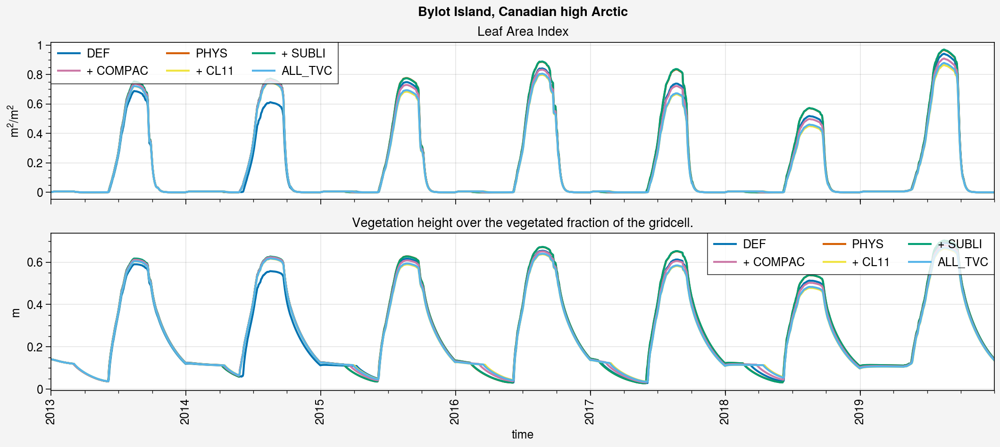

In [8]:
%matplotlib inline
fig, axs = pplt.subplots(ncols=1, nrows=2, refaspect=6, refwidth=10, sharey=0)

for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    axs[0].plot(ds_d.lai, label=label_exp)
    axs[1].plot(ds_d.vegHeight, label=label_exp)

axs[0].format(ylabel=ds_d_list[0].lai.units, title=ds_d_list[0].lai.long_name)
axs[1].format(ylabel=ds_d_list[0].vegHeight.units, title=ds_d_list[0].vegHeight.long_name)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic (2013-2019)')

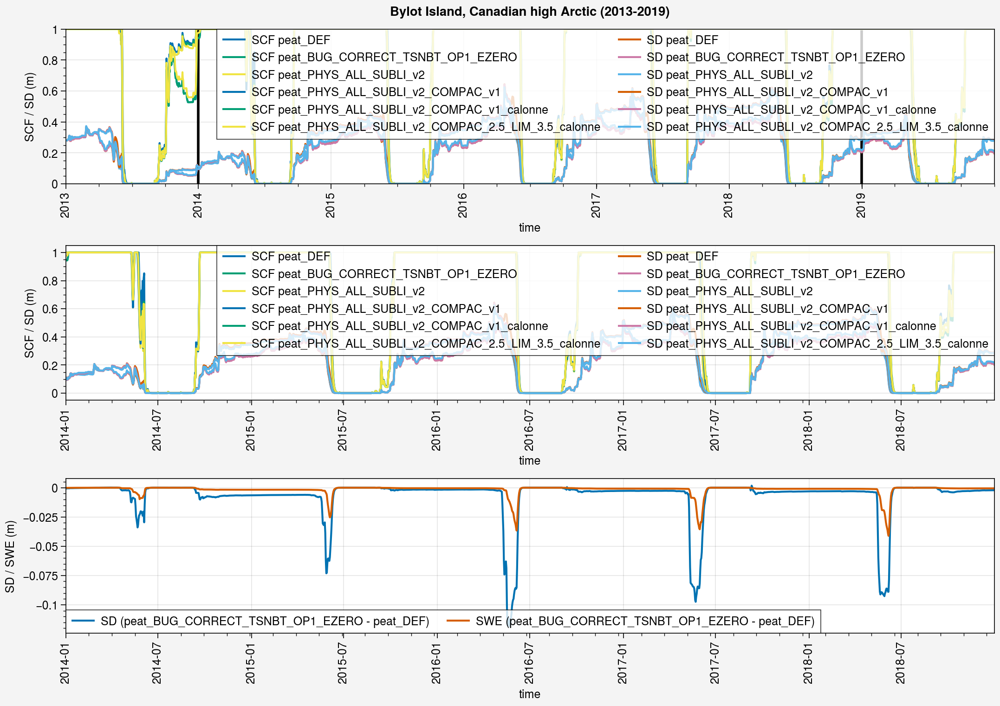

In [9]:
if len(labels) > 1:
    nrows = 3
else: 
    nrows = 2
    
fig, axs = pplt.subplots(ncols=1, nrows=nrows, refaspect=6, refwidth=10, share=0)

##################
### All period ###
##################
start = str(y_start)
end = str(y_end)

for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].legend(ncols=2, loc='ur')
axs[0].format(
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = str(y_start+1)
end = str(y_end-1)

for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[0], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)
axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[-1], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)

axs[1].legend(ncols=2, loc='ur')
axs[1].format(
    ylabel='SCF / SD (m)'
)

if nrows == 3:
    #####################
    ### SWE / SD diff ###
    #####################
    axs[2].plot((ds_d_list[1]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
    axs[2].plot(((ds_d_list[1]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')
    
    axs[2].legend(ncols=2)
    axs[2].format(
        ylabel='SD / SWE (m)'
    )

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')


Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic (2013-2019)')

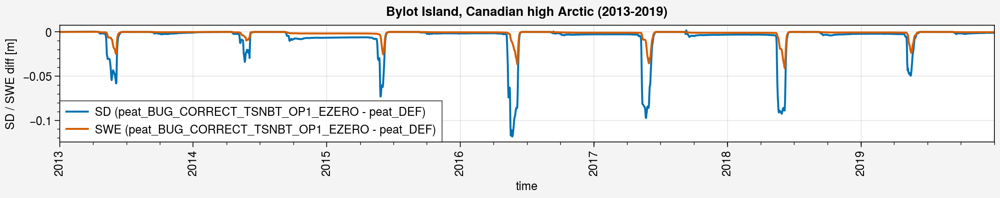

In [10]:
%matplotlib inline
fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=8, refwidth=10, share=0)

start = str(y_start)
end = str(y_end)

axs[0].plot((ds_d_list[1]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
axs[0].plot(((ds_d_list[1]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')

axs[0].legend(ncols=1)
axs[0].format(
    ylabel='SD / SWE diff [m]'
)

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')
# fig.save('img/byl_mtr_SUBLI_diff.jpg')

## Compare with obs

In [11]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Bylot'

ds_h_obs = xr.open_dataset(path_obs+'/obs_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()
ds_h_obs['albs'] = ds_h_obs.albs.where(ds_h_obs.flag_albs_ERA5 == 0).where(ds_h_obs.albs < 1) # to avoid > 1 albedo values
ds_d_obs = ds_h_obs.resample(time='D').mean().load()
ds_h_met = xr.open_dataset(path_obs+'/met_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()

ds_h_obs

<xarray.Dataset> Size: 10MB
Dimensions:         (time: 52202, sdepth: 5, sheight: 10)
Coordinates:
  * time            (time) datetime64[ns] 418kB 2013-07-11T09:00:00 ... 2019-...
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
Data variables:
    snd_auto        (time) float64 418kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 418kB 0.16 0.15 0.17 0.16 ... 0.17 0.16 0.16
    flag_albs_ERA5  (time) int64 418kB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    ts              (time) float64 418kB 9.86 10.42 13.45 ... 10.71 14.89 nan
    mrsll           (sdepth, time) float64 2MB 0.2 0.2 0.2 ... 0.066 0.066 0.066
    tsl             (sdepth, time) float64 2MB 3.7 4.3 4.99 ... -0.3 -0.3 -0.3
    tsnl            (sheight, time) float64 4MB nan nan nan nan ... nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

### Get thermal conductivities

In [12]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
df = pd.read_csv(path_obs+'/Bylot/Bylot_validation_snow_soil_thermal_conductivity.csv', sep=';', parse_dates=['date'], index_col=['date'])
df

,SNOW 22 cm,SNOW 12 cm,SNOW 2 cm,SOIL -10 cm,SNOW 7 cm
date,,,,,
2013-07-12,NaN,NaN,NaN,0.686033,NaN
2013-07-14,NaN,NaN,NaN,0.681628,NaN
2013-07-16,NaN,NaN,NaN,0.700266,NaN
2013-07-18,NaN,NaN,NaN,0.680094,NaN
2013-07-20,NaN,NaN,NaN,0.696302,NaN
...,...,...,...,...,...
2019-06-16,NaN,NaN,NaN,0.905965,NaN
2019-06-18,NaN,NaN,NaN,0.821669,NaN
2019-06-20,NaN,NaN,NaN,0.916831,NaN


In [13]:
ds_obs_tc = df.to_xarray()
ds_obs_tc = ds_obs_tc.rename({'date': 'time'})

ds_obs_tc = ds_obs_tc.assign_coords(sheight=[0.02 , 0.12, 0.22]) 
ds_obs_tc['sheight'].attrs['long_name'] = 'height in snow'
ds_obs_tc['sheight'].attrs['units'] = 'm'

# Combine the Snow Temp. in one variable
ds_obs_tc = ds_obs_tc.assign(
    tcs=(('sheight', 'time'), [
        list(ds_obs_tc['SNOW 2 cm'].values),
        list(ds_obs_tc['SNOW 12 cm'].values),
        list(ds_obs_tc['SNOW 22 cm'].values),
    ])
)
ds_obs_tc['tcs'].attrs['long_name'] = 'Thermal conductivity of snow'
ds_obs_tc['tcs'].attrs['units'] = 'W m$^{-1}$ K$^{-1}$'


ds_obs_tc = ds_obs_tc.assign_coords(sdepth=[0.10]) 
ds_obs_tc['sdepth'].attrs['long_name'] = 'depth in soil'
ds_obs_tc['sdepth'].attrs['units'] = 'm'

ds_obs_tc = ds_obs_tc.assign(
    tc=(('sdepth', 'time'), [
        list(ds_obs_tc['SOIL -10 cm'].values),
    ])
)
ds_obs_tc['tc'].attrs['long_name'] = 'Thermal conductivity of soil'
ds_obs_tc['tc'].attrs['units'] = 'W m$^{-1}$ K$^{-1}$'

ds_obs_tc = ds_obs_tc.drop_vars({'SNOW 2 cm', 'SNOW 7 cm', 'SNOW 12 cm', 'SNOW 22 cm', 'SOIL -10 cm'})

ds_obs_tc

<xarray.Dataset> Size: 44kB
Dimensions:  (time: 1090, sheight: 3, sdepth: 1)
Coordinates:
  * time     (time) datetime64[ns] 9kB 2013-07-12 2013-07-14 ... 2019-06-24
  * sheight  (sheight) float64 24B 0.02 0.12 0.22
  * sdepth   (sdepth) float64 8B 0.1
Data variables:
    tcs      (sheight, time) float64 26kB nan nan nan nan ... nan nan nan nan
    tc       (sdepth, time) float64 9kB 0.686 0.6816 0.7003 ... 0.8086 0.7879

<a list of 1 Line2D objects>

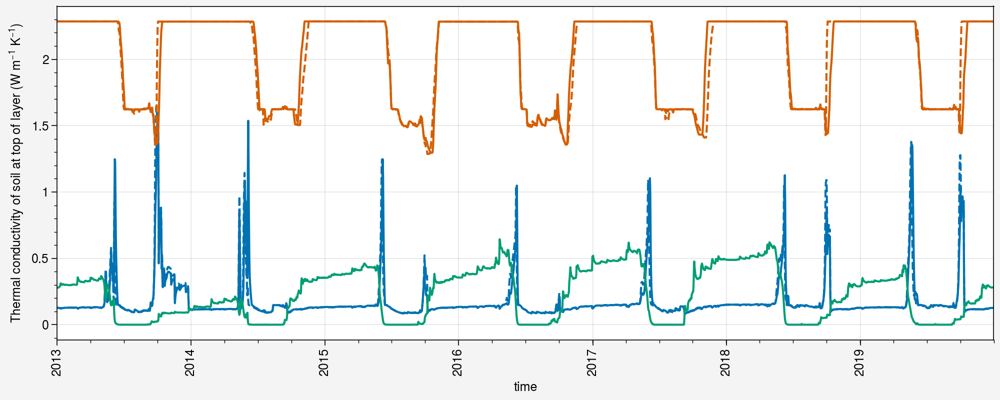

In [14]:
%matplotlib inline
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

ax = axs[0]
ax.plot(ds_d_list[0].tctop.isel(layer=0))
ax.plot(ds_d_list[1].tctop.isel(layer=0), ls='--', c='C0')
# ax.plot(ds_d_list[2].tctop.isel(layer=0), ls='-.', c='C0')
ax.plot(ds_d_list[0].tctop.isel(layer=1))
ax.plot(ds_d_list[1].tctop.isel(layer=1), ls='--', c='C1')
# ax.plot(ds_d_list[0].tcbot.isel(layer=0))
# ax.plot(ds_d_list[1].tcbot.isel(layer=0), ls='--', c='C2')
# ax.plot(ds_d_list[0].tcbot.isel(layer=1))
# ax.plot(ds_d_list[1].tcbot.isel(layer=1), ls='--', c='C3')
# ax.plot(ds_d_list[0].tcbot.isel(layer=2))
# ax.plot(ds_d_list[1].tcbot.isel(layer=2), ls='--', c='C4')
ax.plot(ds_d_list[0].snd)

### Get snowpits density

In [15]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
df = pd.read_csv(path_obs+'/Bylot/BylotDensity2014.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
df

,Location,Height cm,Density kg m-3
Date,,,
2014-05-14,Wet 0,23.5,240
2014-05-14,Wet 0,20.0,349
2014-05-14,Wet 0,17.0,416
2014-05-14,Wet 0,14.0,432
2014-05-14,Wet 0,11.0,419
2014-05-14,Wet 0,7.5,431
2014-05-14,Wet 0,2.0,201
2014-05-14,TUNDRA,18.5,132
2014-05-14,TUNDRA,15.5,409


In [16]:
tundra_df = df[df['Location'] == 'TUNDRA']
tundra_df

,Location,Height cm,Density kg m-3
Date,,,
2014-05-14,TUNDRA,18.5,132
2014-05-14,TUNDRA,15.5,409
2014-05-14,TUNDRA,12.0,228
2014-05-14,TUNDRA,9.0,283
2014-05-14,TUNDRA,5.0,383


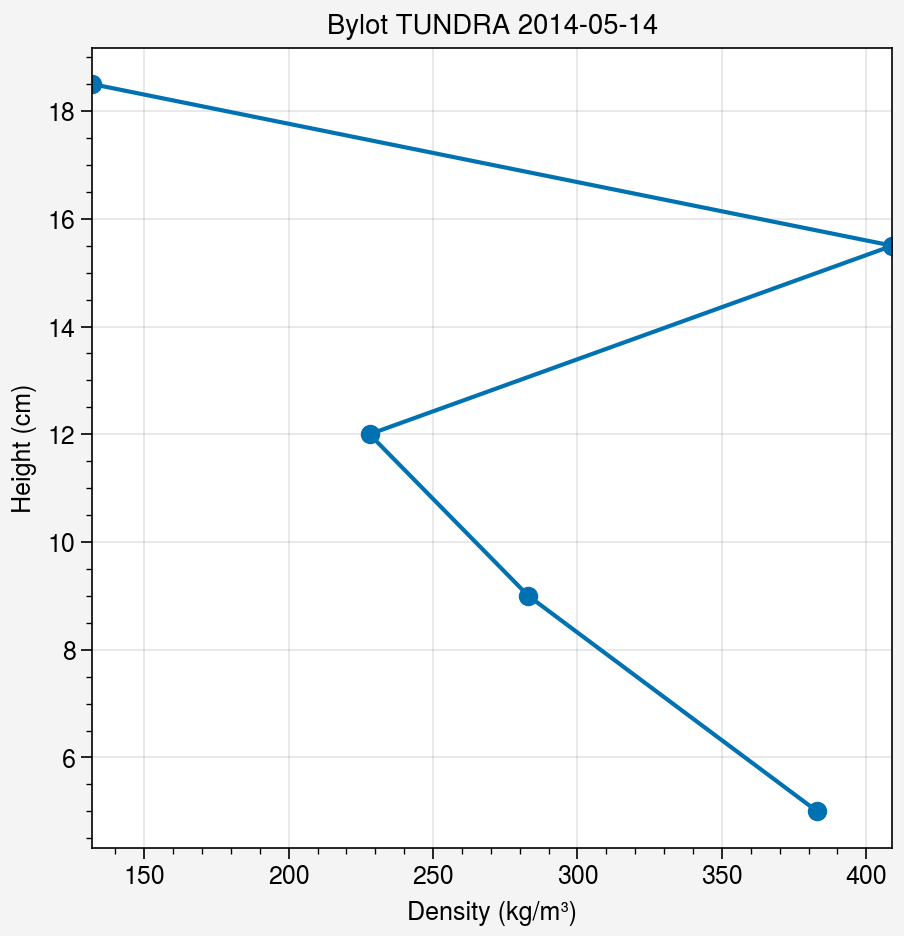

In [17]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=4)

ax = axs[0]
ax.plot(tundra_df['Density kg m-3'], tundra_df['Height cm'], marker='o', linestyle='-')
ax.format(title='Bylot TUNDRA ' + str(tundra_df.index[0])[:10],
          xlabel='Density (kg/m³)',
          ylabel='Height (cm)',
          grid=True)

In [18]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'

df_list_tundra = []
for year in ['2014', '2015', '2017', '2018', '2019']:
# for year in ['2019']:
    df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
    df_list_tundra.append(df[(df['Location'] == 'TUNDRA') | (df['Location'] == 'Tundra')])

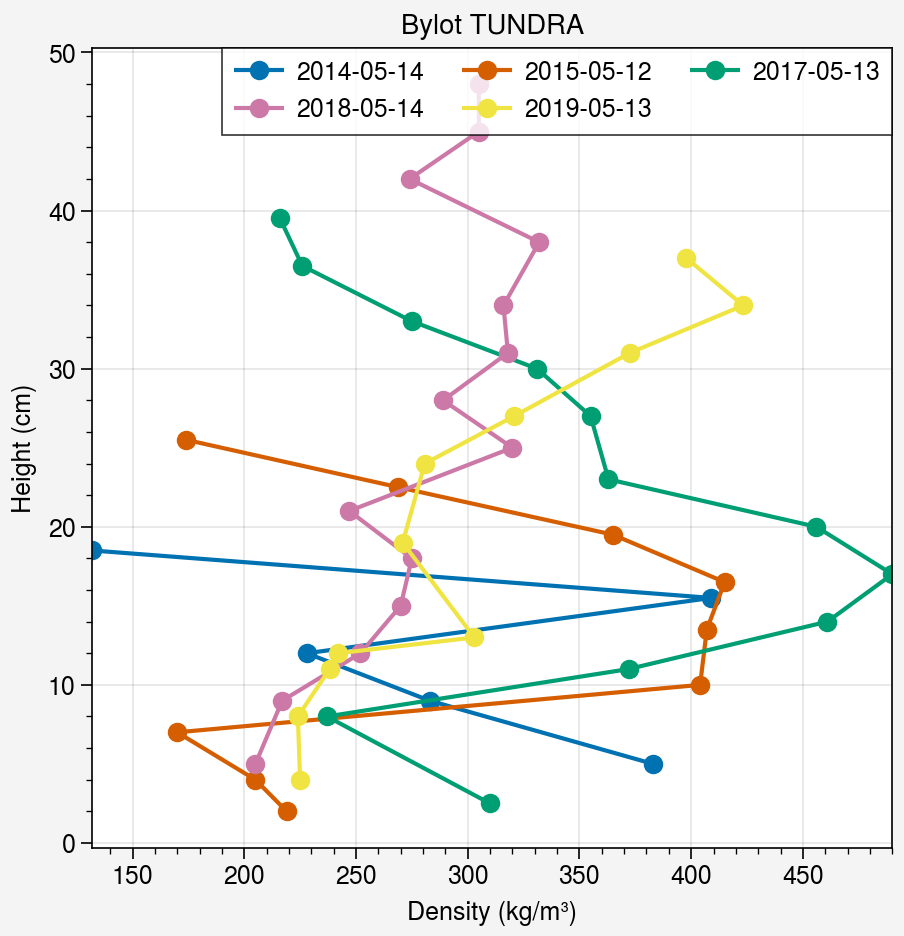

In [19]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=4)

ax = axs[0]

for tundra_df in df_list_tundra:
    ax.plot(tundra_df['Density kg m-3'], tundra_df['Height cm'], marker='o', linestyle='-', label=str(tundra_df.index[0])[:10])
ax.format(title='Bylot TUNDRA', xlabel='Density (kg/m³)', ylabel='Height (cm)', grid=True)
ax.legend()

In [20]:
df_list_tundra[1]

,Location,Height cm,Density kg m-3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
Date,,,,,,,,,,,,,
2015-05-12,Tundra,25.5,174.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,22.5,269.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,19.5,365.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,16.5,415.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,13.5,407.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,10.0,404.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,7.0,170.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,4.0,205.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,2.0,219.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df_list_tundra[1]['Height cm'].iloc[0]-df_list_tundra[1]['Height cm'].iloc[-1]

23.5

In [22]:
for tundra_df in df_list_tundra:
    print(tundra_df.index[0])
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    print('Obs : ' + str(np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz))
    print('Model : ' + str(ds_d_list[0].snwdens.sel(time=tundra_df.index[0]).values))
    print()

2014-05-14 00:00:00
Obs : 298.1296296296296
Model : 367.28167951675726

2015-05-12 00:00:00
Obs : 310.01063829787233
Model : 224.5691036140388

2017-05-13 00:00:00
Obs : 342.02702702702703
Model : 287.51251060998516

2018-05-14 00:00:00
Obs : 282.1279069767442
Model : 245.58646571390003

2019-05-13 00:00:00
Obs : 300.5924242424242
Model : 411.3460047277054



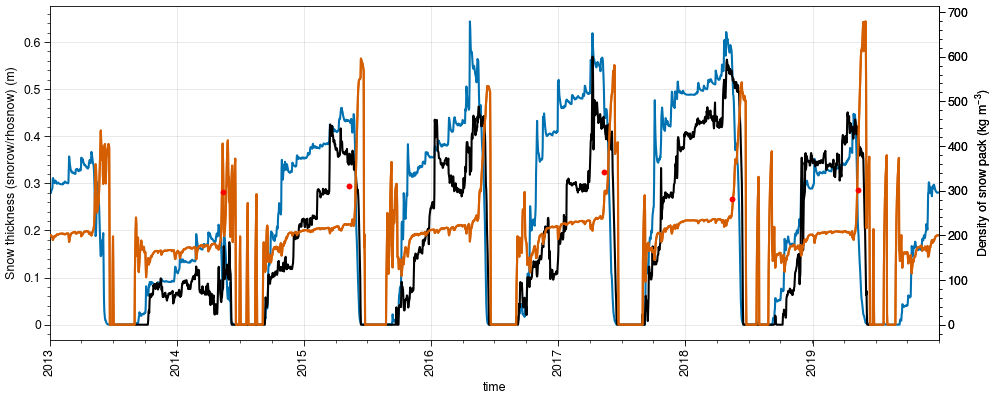

In [23]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

ax = axs[0]
ax.plot(ds_d_list[0].snd)
ax.plot(ds_d_obs.snd_auto, color='k')

ox = ax.alty()
ox.plot(ds_d_list[0].snwdens, color='C1')
# ox.plot(ds_d_list[0].snwdens.shift(time=15), color='C1')
for tundra_df in df_list_tundra:
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

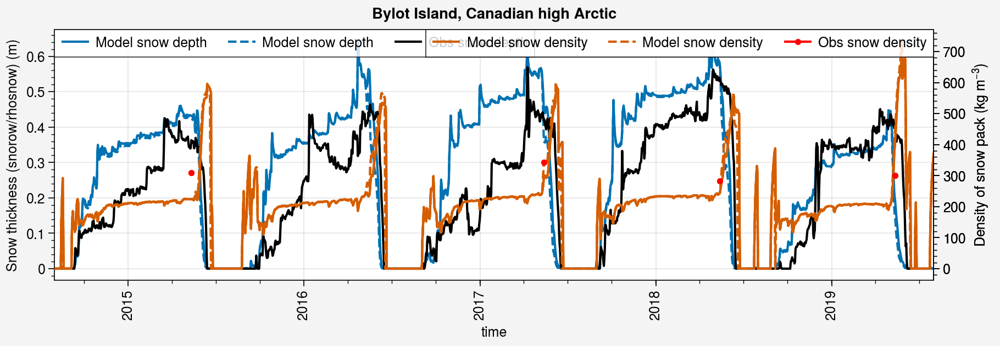

In [24]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
# fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_d_list[0].sel(time=period).snd, label='Model snow depth')
ax.plot(ds_d_list[1].sel(time=period).snd, label='Model snow depth', ls='--', c='C0')
# ax.plot(ds_d_list[2].sel(time=period).snd, label='Model snow depth', ls='-.', c='C0')
ax.plot(ds_d_obs.sel(time=period).snd_auto, color='k', label='Obs snow depth')

ox = ax.alty()
ox.plot(ds_d_list[0].sel(time=period).snwdens, color='C1', label='Model snow density')
ox.plot(ds_d_list[1].sel(time=period).snwdens, color='C1', label='Model snow density', ls='--')
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red', label='Obs snow density')
    if i == 0: ox.legend(loc='ur')
ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend()
fig.suptitle(site_longname)
# fig.save('img/'+site+'_snd_snwdens_2014-2019.jpg')

### SD

In [25]:
path_SALIX = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Bylot/timelapse/SALIX_F'
df_SALIX = pd.read_excel(path_SALIX+'/SnowDepth_SALIX_F.xlsx', skiprows=1, date_format='time_stamp', index_col='time_stamp')
df_SALIX.index.names = ['time']
df_SALIX

,TUNDRA,SALIX-F
time,,
2016-07-09 14:00:00,0.0,0.0
2016-07-09 15:00:00,0.0,0.0
2016-07-09 16:00:00,0.0,0.0
2016-07-09 17:00:00,0.0,0.0
2016-07-09 18:00:00,0.0,0.0
...,...,...
2019-07-05 10:00:00,0.0,0.0
2019-07-05 11:00:00,0.0,0.0
2019-07-05 12:00:00,0.0,0.0


In [26]:
ds_SALIX = df_SALIX.to_xarray()
ds_SALIX

<xarray.Dataset> Size: 628kB
Dimensions:  (time: 26185)
Coordinates:
  * time     (time) datetime64[ns] 209kB 2016-07-09T14:00:00 ... 2019-07-05T1...
Data variables:
    TUNDRA   (time) float64 209kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    SALIX-F  (time) float64 209kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0

In [27]:
tot_year = y_end - y_start + 1
gap = 6
years = pplt.arange(y_start, y_end)
years

array([2013, 2014, 2015, 2016, 2017, 2018, 2019])

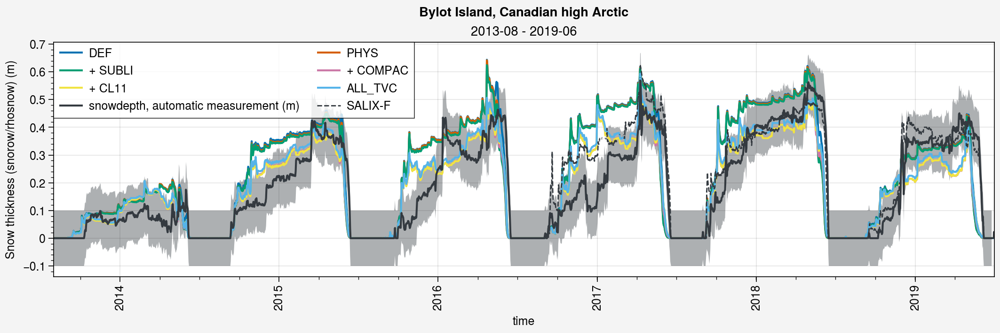

In [28]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.snd.sel(time=period), label=label_exp)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

    axs[0].plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1)
    

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


In [29]:
path_timelapse = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Bylot/timelapse/TUNDRA/01-15Juil15-11juil16'
filename = 'S001A001R000.csv'

df_timelapes = pd.read_csv(path_timelapse+'/'+filename, parse_dates=['Time'], index_col=['Time'])
df_timelapes

,Snow Depth
Time,
2015-07-15 11:00:00,0.0
2015-07-15 12:00:00,0.0
2015-07-15 13:00:00,0.0
2015-07-16 11:00:00,0.0
2015-07-16 12:00:00,0.0
...,...
2016-07-10 11:00:00,0.0
2016-07-10 12:00:00,0.0
2016-07-10 13:00:00,0.0


In [30]:
da_timelapes = df_timelapes.to_xarray().rename({'Time': 'time', 'Snow Depth': 'snd'})
da_timelapes

<xarray.Dataset> Size: 11kB
Dimensions:  (time: 696)
Coordinates:
  * time     (time) datetime64[ns] 6kB 2015-07-15T11:00:00 ... 2016-07-11T12:...
Data variables:
    snd      (time) float64 6kB 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0

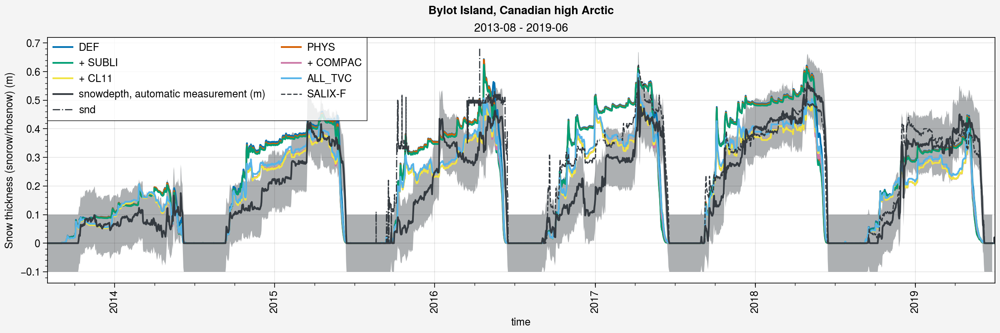

In [31]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, figsize=(12,4))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.snd.sel(time=period), label=label_exp)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

    axs[0].plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1)
    axs[0].plot(da_timelapes.sel(time=period).snd, color=color_obs, ls='-.', lw=1)
    

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


3- Je te laisse regarder la caméra time lapse pendant l'année dont tu parles, ça t'éclairera peut etre. Les jalons vont te permettre de déterminer la H neige. Il y a un peu moins de vent à cet endroit et les arbustes ont un petit effet stabilisateur.
https://www.dropbox.com/scl/fo/ze6nl1su32xuckaovv0wj/h?rlkey=cwrn501w3yq0huf4ju20lhmfu&dl=0

In [32]:
# %matplotlib inline

# color_obs = 'gray8'

# fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, figsize=(8,4))

# period=slice('2015-08','2016-06')

# # Simus
# for ds_d, label, label_exp in zip(ds_d_list[0:1], labels[0:1]):
#     axs[0].plot(ds_d.snd.sel(time=period), label='Model CLASSIC')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
#     np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
# # axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
# axs[0].plot(ds_d_obs.snd_auto.sel(time=period), color=color_obs)
# # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

# # axs[0].plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1)
# axs[0].plot(da_timelapes.sel(time=period).snd, color=color_obs, ls='--', lw=1, label='time lapse CAMERA TUNDRA')


# # Veg
# # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)

# axs[0].legend(loc='ul', ncols=2)
# axs[0].format(title=period.start+' - '+period.stop)

# fig.suptitle(site_longname+' TUNDRA')


### SWE

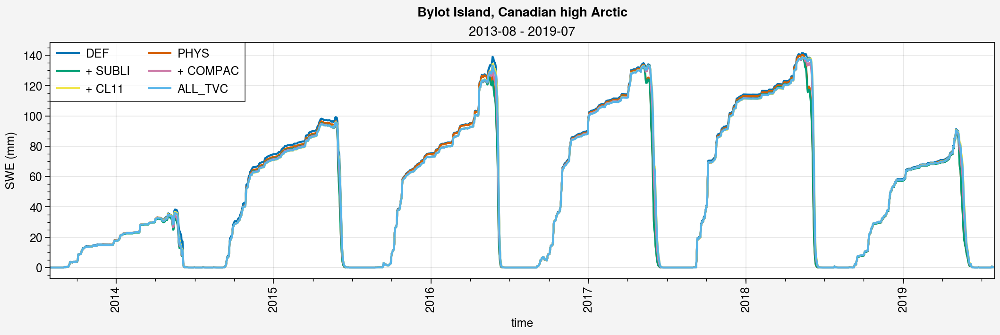

In [33]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.snw.sel(time=period), label=label_exp)
    
    # Obs
    # shadedata = np.concatenate((
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values+25, axis=0),
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
    # axs[0].plot(ds_d_obs.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snw_man.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='SWE (mm)')
    
    fig.suptitle(site_longname)


### Albedo

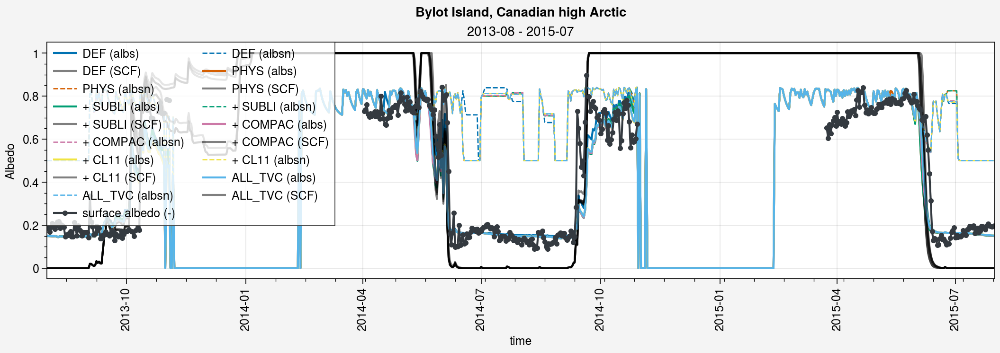

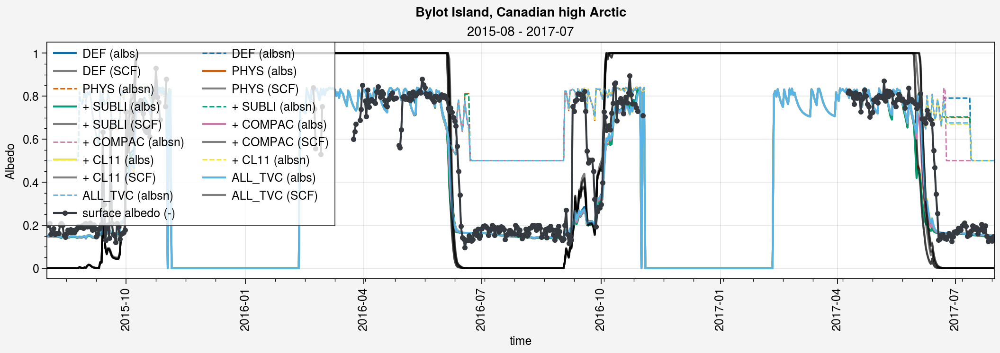

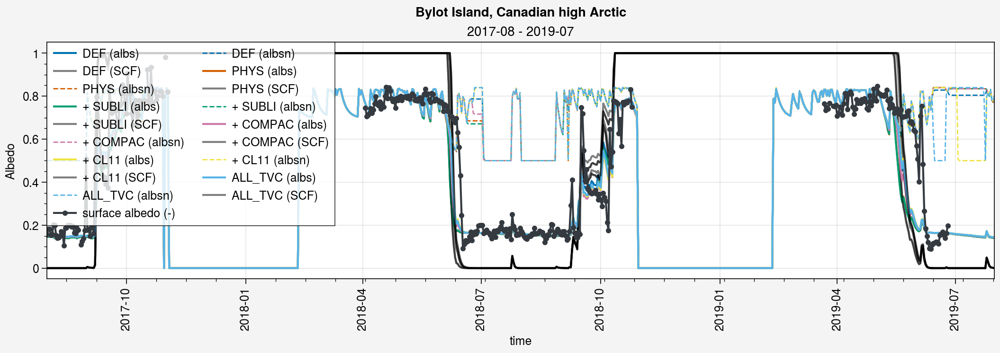

In [34]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    k = 0
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.albs.sel(time=period), label=label_exp+' (albs)', color='C'+str(k))
        axs[0].plot(ds_d.albsn.sel(time=period), label=label_exp+' (albsn)', color='C'+str(k), ls='--', lw=1)
        axs[0].plot(ds_d.snc.sel(time=period), label=label_exp+' (SCF)', color='k', alpha=0.5)
        
        k+=1
    
    # Obs
    axs[0].plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Albedo')
    
    fig.suptitle(site_longname)


### Surface Temperature

Domine et al. ([2019](https://onlinelibrary.wiley.com/doi/abs/10.1029/2018MS001445)): "**Averaged over a period of several days the surface temperatures are essentially the same**. The amplitude variations are greater in the Alpine snowpack (Figure 8b) because the insulating layer at the top does not allow damping the air temperature variations by heat exchanges with the snowpack. This effect is more important in April and May, when daily temperature variations reach 20 °C, sometimes more. The absolute temperature differences reaches 4.7 °C on 8 February, when the temperature suddenly increases by 15 °C in 5 hr, and the surface temperature of the Alpine snowpack increases more rapidly."

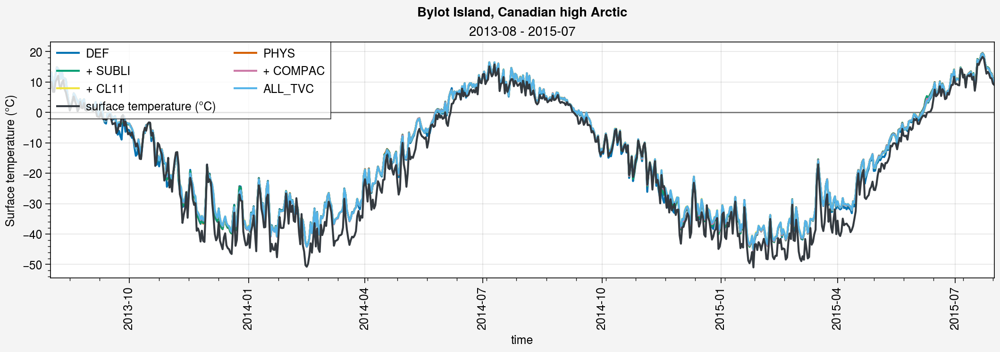

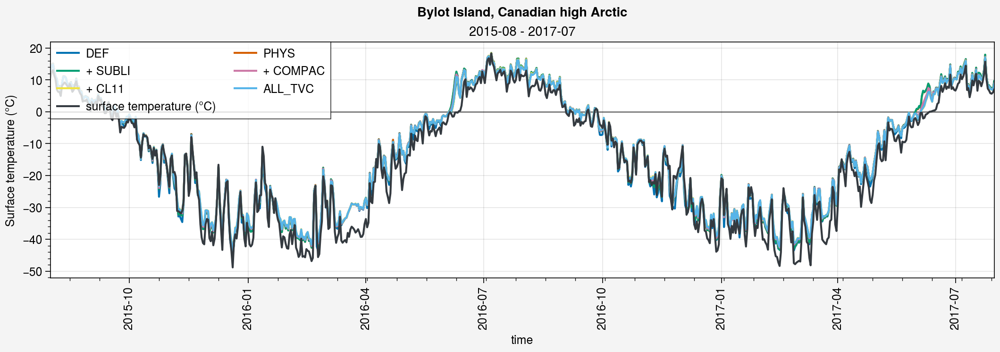

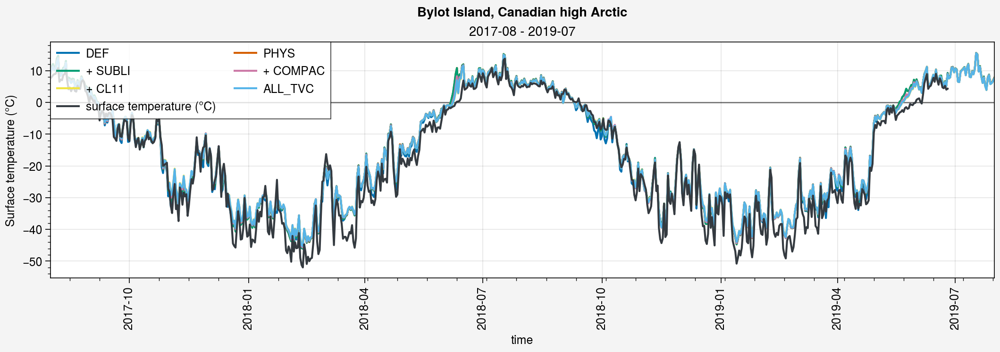

In [35]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.ts.sel(time=period)-273.15, label=label_exp)
    
    # Obs
    axs[0].plot(ds_d_obs.ts.sel(time=period), color=color_obs)
    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Surface temperature (°C)')
    
    fig.suptitle(site_longname)


### Soil Temperature

<a list of 5 Line2D objects>

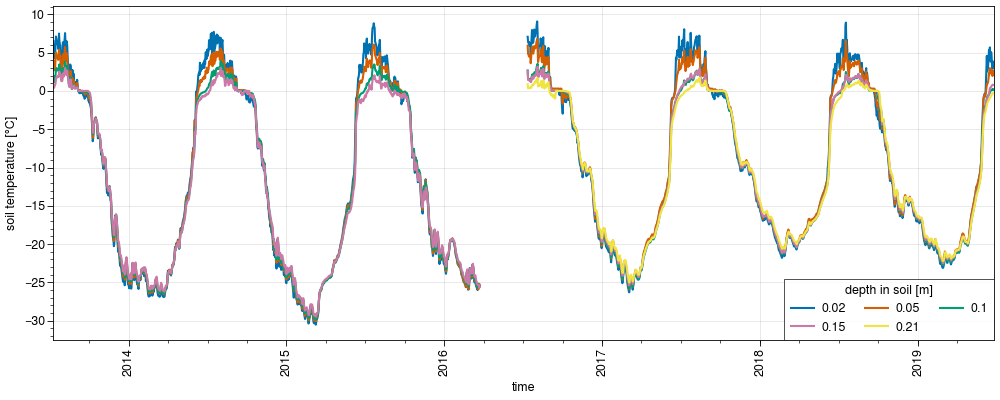

In [36]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,4))
ds_d_obs.tsl.plot(hue='sdepth')

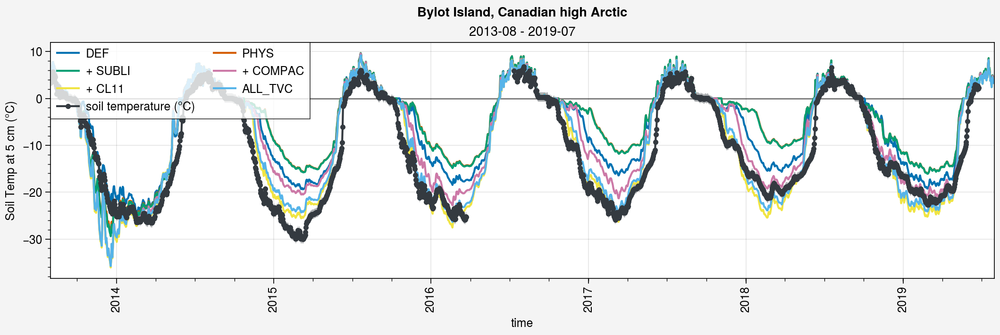

In [37]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.05
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label_exp)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label_exp)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label_exp)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth)-273.15, label=label_exp)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


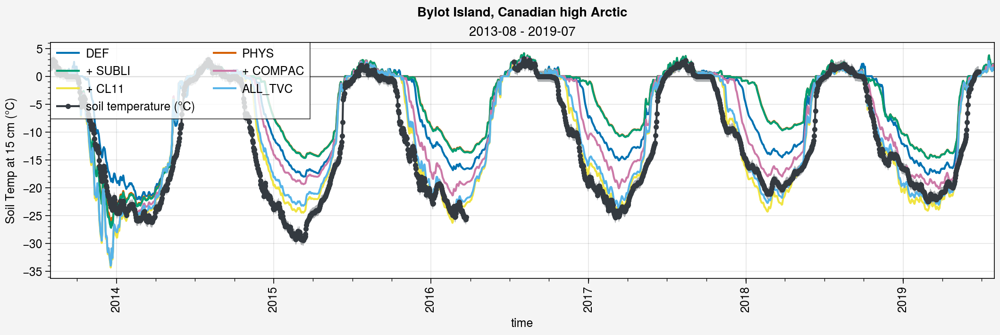

In [38]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label_exp)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label_exp)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label_exp)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth, method='nearest')-273.15, label=label_exp)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


### Snow temperature

<a list of 10 Line2D objects>

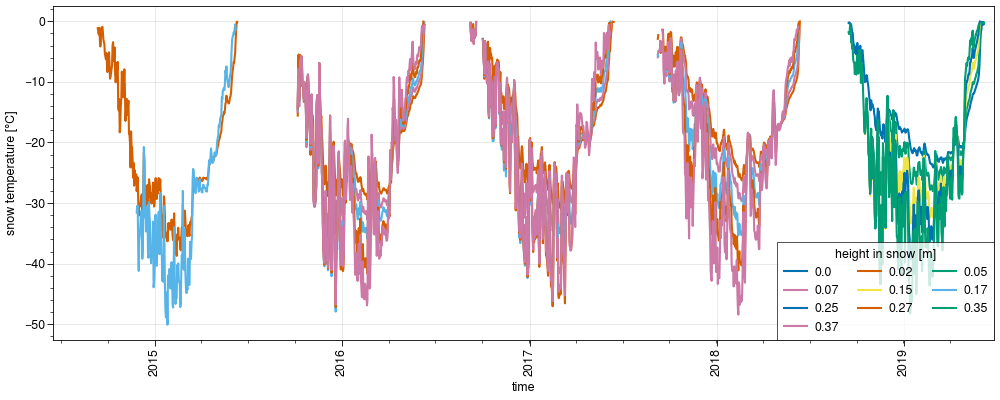

In [39]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,4))
ds_d_obs.tsnl.plot(hue='sheight')

In [40]:
ds_d_obs.tsnl

<xarray.DataArray 'tsnl' (time: 2176, sheight: 10)> Size: 174kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * sheight  (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.25 0.27 0.35 0.37
  * time     (time) datetime64[ns] 17kB 2013-07-11 2013-07-12 ... 2019-06-25
Attributes:
    long_name:  snow temperature
    units:      °C

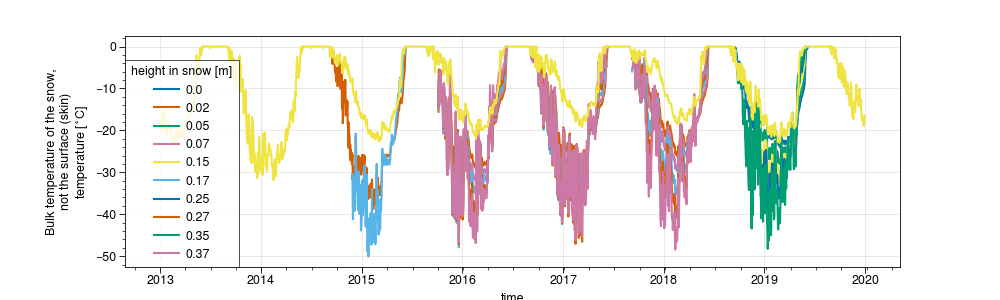

In [41]:
%matplotlib widget
plt.figure(figsize=(10,3))
ds_d_obs.tsnl.plot(hue='sheight')
# ds_d_obs.ts.plot(color='black')
ds_d_list[0].tsn.plot()
# (ds_d_list[0].ts-273.15).plot(color='red')


In [42]:
date = '2016-02-01'
def T(z, a, b, c):
    return 1/2*a*z**2 + b*z + c

z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
c = (ds_d_list[0].sel(time=date).ts-273.15).values
b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
a = (-b/ds_d_list[0].sel(time=date).snd).values
tsn_theoric = T(z, a, b, c)

tsn_th = np.trapz(tsn_theoric, x=z)/z[-1]
# print('Snow temperature from obs: {:.2f}'.format(tsn_obs)+' °C')
print('Theoric snow temperature (model): {:.2f}'.format(tsn_th.item(0))+' °C')
print('Snow temperature from model: {:.2f}'.format(ds_d.sel(time=date).tsn.values.item(0))+' °C')

Theoric snow temperature (model): -18.75 °C
Snow temperature from model: -29.09 °C


In [43]:
tsn_theoric

array([-37.09221116, -35.98049279, -34.89169646, -33.82582215,
       -32.78286988, -31.76283963, -30.7657314 , -29.79154521,
       -28.84028104, -27.91193891, -27.0065188 , -26.12402072,
       -25.26444466, -24.42779064, -23.61405864, -22.82324867,
       -22.05536073, -21.31039482, -20.58835093, -19.88922908,
       -19.21302925, -18.55975145, -17.92939567, -17.32196193,
       -16.73745021, -16.17586052, -15.63719286, -15.12144723,
       -14.62862363, -14.15872205, -13.71174251, -13.28768499,
       -12.88654949, -12.50833603, -12.1530446 , -11.82067519,
       -11.51122781, -11.22470246, -10.96109913, -10.72041784,
       -10.50265857, -10.30782133, -10.13590612,  -9.98691294,
        -9.86084179,  -9.75769266,  -9.67746556,  -9.62016049,
        -9.58577745,  -9.57431644])

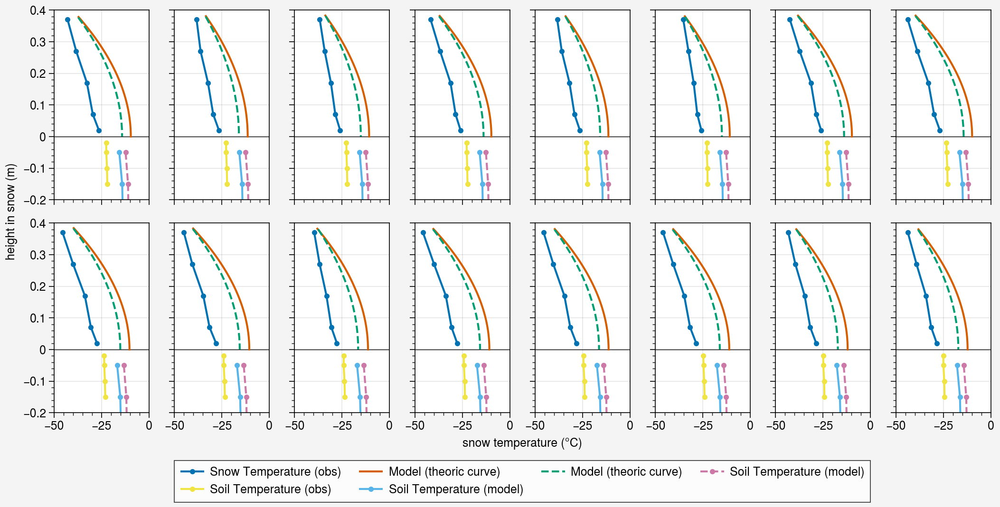

In [44]:
%matplotlib inline
import math
data_range = pd.date_range('2016-02-01', '2016-02-16')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
    c = (ds_d_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_d_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')



    z = np.linspace(0, ds_d_list[1].sel(time=date).snd.squeeze())
    c = (ds_d_list[1].sel(time=date).ts-273.15).values
    b = ((-3/ds_d_list[1].sel(time=date).snd)*(c-ds_d_list[1].sel(time=date).tsn.values)).values
    a = (-b/ds_d_list[1].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)', ls='--')
    axs[i].plot(ds_d_list[1].tsl.sel(time=date)-273.15, -ds_d_list[1].layer, label='Soil Temperature (model)', marker='.', ls='--')

    
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 0), ylim=(-0.2, 0.4))
    axs[i].hlines(0, -50, 0, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

#### Add tsn to ds_d_obs
Results done bellow are very close to the average actually but that's a bit more correct to do like this. 

In [45]:
ds_d_obs['tsn'] = ds_d_obs.snd_auto.copy()*np.nan

for i, day in enumerate(ds_d_obs.time.values):
    # Get only values lower than the measured surface temperature
    ds_temp = ds_d_obs.tsnl.sel(time=day).dropna(dim='sheight').where(
        ds_d_obs.tsnl.sel(time=day).dropna(dim='sheight').sheight < ds_d_obs.snd_auto.sel(time=day).values,
        drop=True
    )
    ds_temp

    if ds_temp.shape[0] > 0:
        # Append the surface temperature and compute the average
        tsn = np.trapz(
            np.append(ds_temp.values, ds_d_obs.ts.sel(time=day).values),
            np.append(ds_temp.sheight.values, ds_d_obs.snd_auto.sel(time=day).values)
        )/(ds_d_obs.snd_auto.sel(time=day).values-ds_temp.sheight.values[0])

    else:
        tsn = np.nan

    ds_d_obs['tsn'][i] = tsn

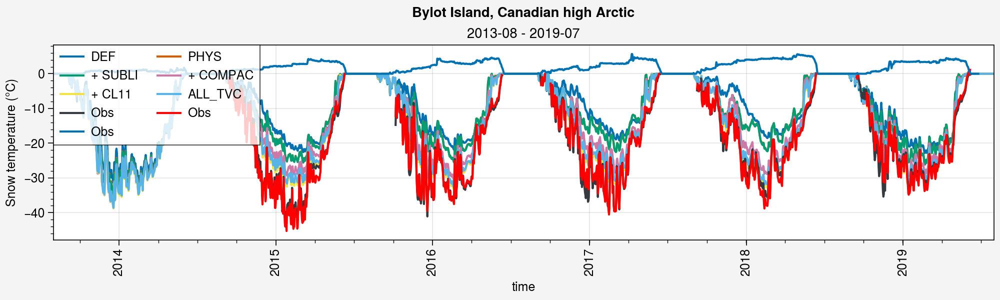

In [46]:
%matplotlib inline
gap = 6
color_obs = 'gray8'

for i in range(tot_year//gap):
    # fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)
    fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(10,3))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.tsn.sel(time=period), label=label_exp)
        
    # Obs
    axs[0].plot(ds_d_obs.tsnl.mean('sheight').sel(time=period), color=color_obs, label='Obs')
    axs[0].plot(ds_d_obs.tsn.sel(time=period), color='red', label='Obs')
    
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period)*10, label='Obs')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Snow temperature (°C)')
    
    fig.suptitle(site_longname)


#### Compute TSNBOT_TH for all timesteps
T(z) = 1/2az² + bz + c

z axis towards the bottom

In [47]:
TSNBOT_obs = (ds_h_obs.tsnl.sel(sheight=0.02) + ds_h_obs.tsl.sel(sdepth=0.02))/2
TSNBOT_obs = TSNBOT_obs.combine_first(ds_h_obs.tsnl.sel(sheight=0.00)) # add the 2019 year with exact TSNBOT value

In [48]:
TSNBOT_obs_day = (ds_d_obs.tsnl.sel(sheight=0.02) + ds_d_obs.tsl.sel(sdepth=0.02))/2
TSNBOT_obs_day = TSNBOT_obs_day.combine_first(ds_d_obs.tsnl.sel(sheight=0.00)) # add the 2019 year with exact TSNBOT value

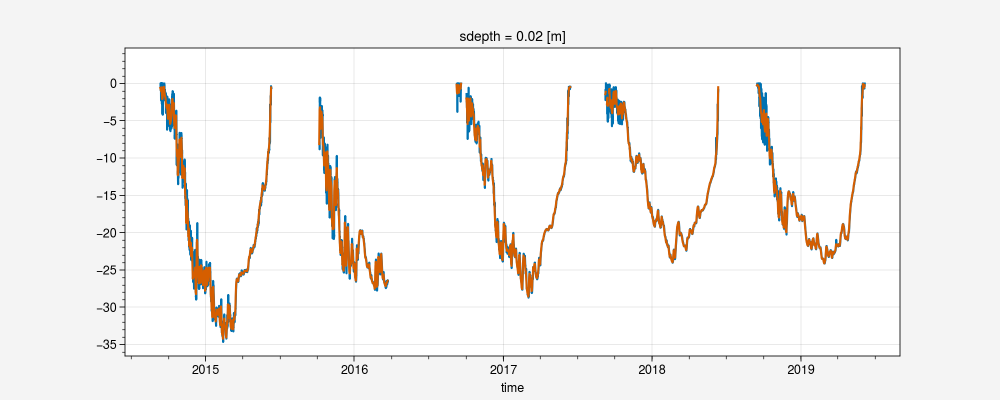

In [49]:
%matplotlib inline
plt.figure(figsize=(10, 4))
TSNBOT_obs.plot()
TSNBOT_obs_day.plot()

### Volumetric water content

https://medium.com/@wenzhao.li1989/soil-moisture-convert-mm-kg-m-2-and-m%C2%B3-m-3-e52be1fe98ef

The NCA-LDAS dataset currently provide soil moisture values in units of [m³ m-3] for volumetric soil moisture. To convert to units of [kg m-2] for the total soil moisture amount in each layer, all you do is multiply the [m³ m-3] value by the thickness of the layer in [mm].

<a list of 5 Line2D objects>

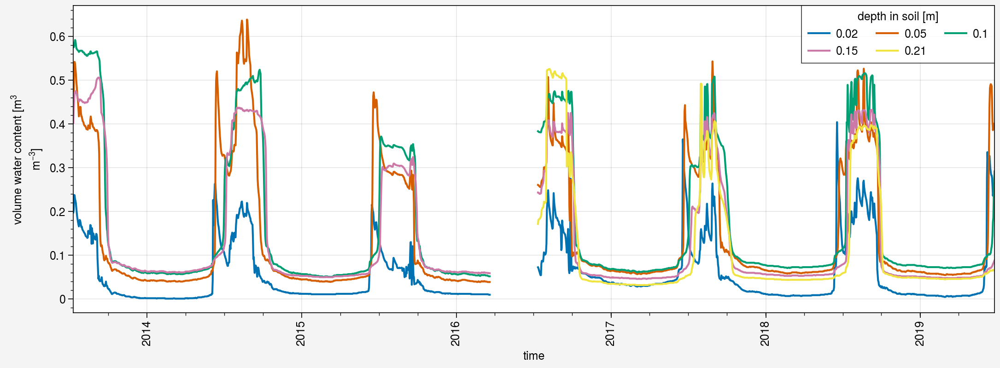

In [50]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_d_obs.mrsll.plot(hue='sdepth')

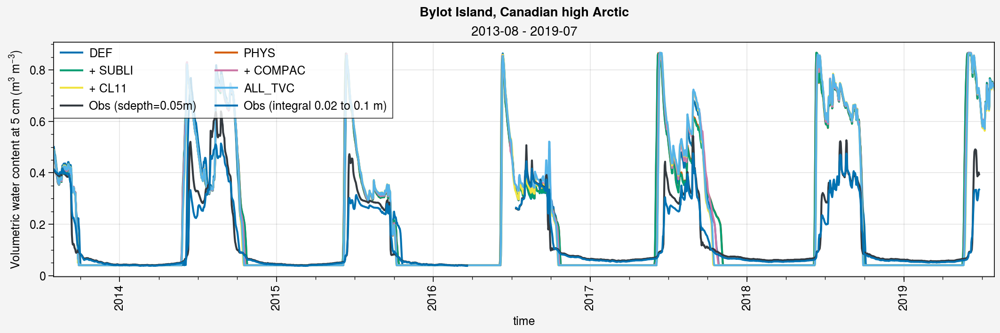

In [51]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.05
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth)/100, label=label_exp)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth), color=color_obs, label='Obs (sdepth=0.05m)')
    axs[0].plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02)), label='Obs (integral 0.02 to 0.1 m)')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


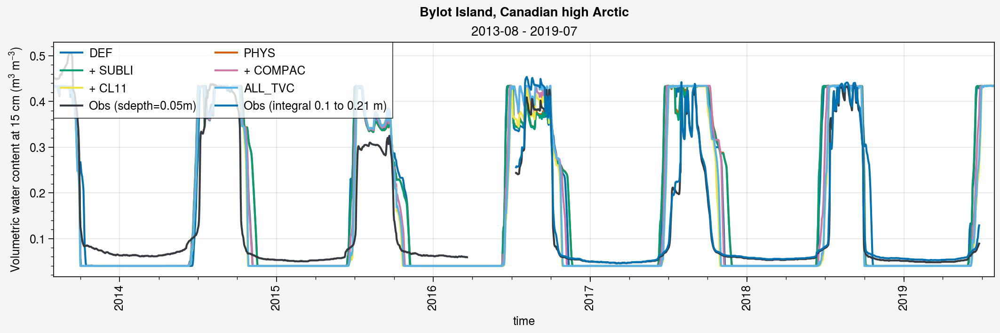

In [52]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label_exp)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth), color=color_obs, label='Obs (sdepth=0.05m)')
    axs[0].plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1)), label='Obs (integral 0.1 to 0.21 m)')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


### Thermal conductivity

<a list of 1 Line2D objects>

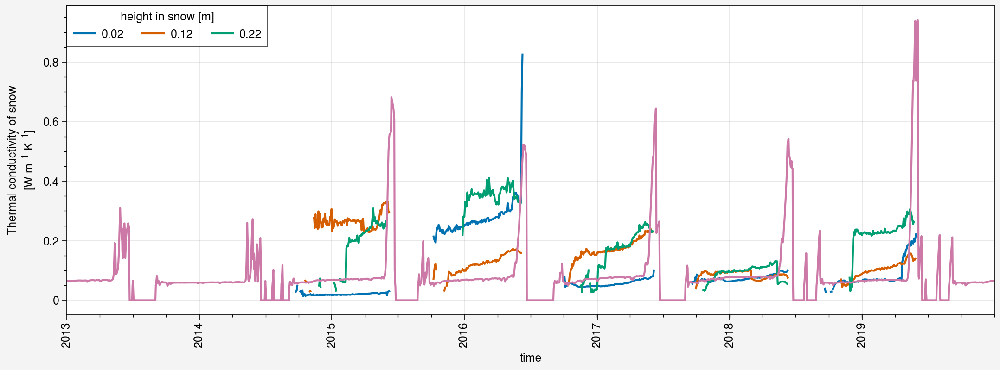

In [53]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_obs_tc.tcs.plot(hue='sheight')
ds_d_list[0].tcsnow.plot()

#### Compute the effective thermal conductivity

In [54]:
sd = ds_d_obs.snd_auto.sel(time=ds_obs_tc.tcs.time)
z1 = sd.copy(); z2 = sd.copy(); z3 = sd.copy()
z1.values = [0.02]*sd.size
z2.values = [0.12]*sd.size
z3.values = [0.22]*sd.size

dz1 = (z1 + z2)/2
dz2 = (z2 + z3)/2 - z1
dz3 = sd - (z2 + z3)/2

# Keep only values for sd higher than the sensor height
dz3 = dz3.where(z3 < sd)
dz2 = dz2.where(z2 < sd)
dz1 = dz1.where(z1 < sd)

In [55]:
tcs_hmean = sd.copy()
tcs_hmean.values = stats.hmean(ds_obs_tc.tcs, weights=[dz1, dz2, dz3], nan_policy='omit')
tcs_hmean

<xarray.DataArray 'snd_auto' (time: 1090)> Size: 9kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 9kB 2013-07-12 2013-07-14 ... 2019-06-24
Attributes:
    long_name:  snowdepth, automatic measurement
    units:      m

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

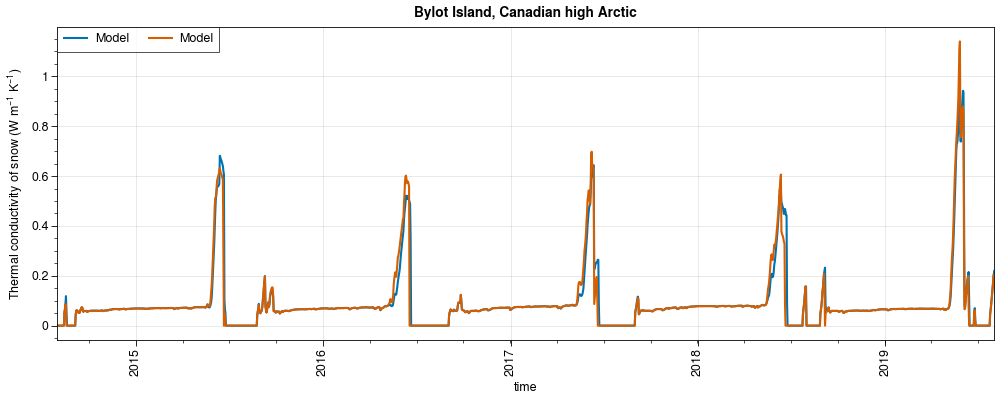

In [56]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[1].tcsnow.sel(time=period), label='Model')
# ax.plot(ds_d_list[2].tcsnow.sel(time=period), label='Model')
# ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend(ncols=5)
fig.suptitle(site_longname)
# fig.save('img/'+site+'_tcsnow_2014-2019.jpg')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

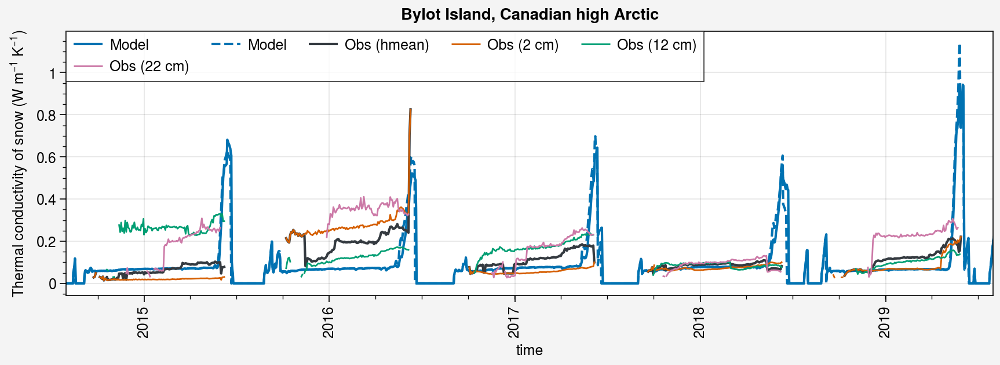

In [57]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
# fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[1].tcsnow.sel(time=period), label='Model', c='C0', ls='--')
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend(ncols=5)
fig.suptitle(site_longname)
# fig.save('img/'+site+'_tcsnow_2014-2019.jpg')

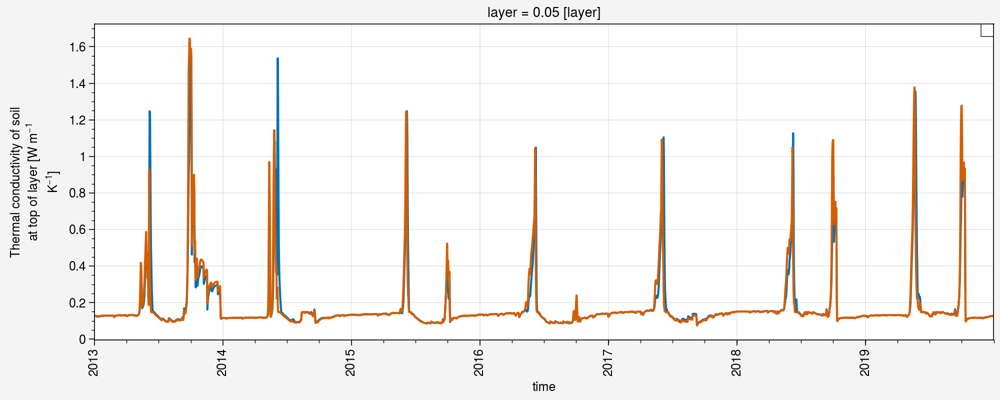

In [58]:
%matplotlib inline
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

# ds_obs_tc.tc.plot(label='TC at 10 cm depth')
# tctop.sel(layer=[0.05, 0.15, 0.25], method='nearest').plot(hue='layer')
ds_d_list[0].tctop.sel(layer=0.05, method='nearest').plot()
ds_d_list[1].tctop.sel(layer=0.05, method='nearest').plot()
axs[0].legend()

## All 

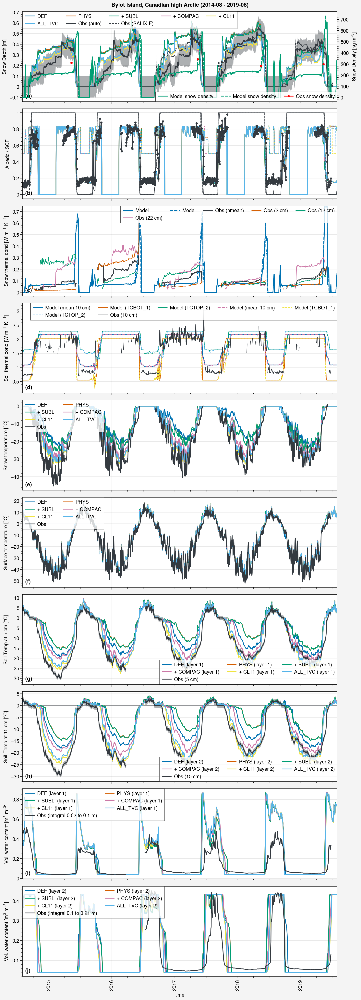

In [59]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2014-08', '2019-08')

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=10, ncols=1, refaspect=3.5, refwidth=8, sharey=0)
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.snd.sel(time=period), label=label_exp)
    # axs[0].plot(ds_d.snc.sel(time=period), label=label_exp+' (SCF)', color='k', alpha=0.5)

ox = ax.alty(label='Snow Density [kg m$^{-3}$]')
ox.plot(ds_d_list[0].sel(time=period).snwdens, color='C2', label='Model snow density')
ox.plot(ds_d_list[1].sel(time=period).snwdens, color='C2', label='Model snow density', ls='--')
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red', label='Obs snow density')
    if i == 0: ox.legend(loc='lr')
        
# ox = ax.alty(label='Snow Cover Fraction')
# ox.line(ds_d.snc.sel(time=period), label='SCF', color='grey6', lw=0.8, ls='--')
# ox.legend(loc='ur')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)')
ax.plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1, label='Obs (SALIX-F)')

ax.legend(ncols=5, loc='ul')
ax.format(ylabel='Snow Depth [m]', 
          xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
         )

k += 1
##################
### Albedo ###
##################
ax = axs[k]
i=0
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.albs.sel(time=period), label=label_exp+' (albs)', color='C'+str(i))
    ax.plot(ds_d.albsn.sel(time=period), label=label_exp+' (albsn)', color='C'+str(i), ls='--', lw=1)
    ax.plot(ds_d.snc.sel(time=period), label=label_exp+' (SCF)', color=color_obs, alpha=0.5, ls='--', lw=1)
    i+=1
# Obs
ax.plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs, label='Surface albedo obs')

# ax.legend(loc='ul', ncols=4)
ax.format(ylabel='Albedo / SCF')


k += 1
##################
### Thermal cond in snow ###
##################
ax = axs[k]

ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[1].tcsnow.sel(time=period), label='Model', ls='--', c='C0')
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    ylabel='Snow thermal cond [W m$^{-1}$ K $^{-1}$]',
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
    ylim=(-0.03, 0.75)
)
ax.legend(ncols=5)


k += 1
##################
### Thermal cond soil ###
##################
ax = axs[k]

mean = 0.5*ds_d_list[0].tctop.sel(layer=0.15, method='nearest') + 0.5*ds_d_list[0].tcbot.sel(layer=0.05, method='nearest')
ax.plot(mean.sel(time=period), label='Model (mean 10 cm)')
ax.plot(ds_d_list[0].tcbot.sel(layer=0.05, method='nearest').sel(time=period), label='Model (TCBOT_1)', lw=1)
ax.plot(ds_d_list[0].tctop.sel(layer=0.15, method='nearest').sel(time=period), label='Model (TCTOP_2)', lw=1)

mean = 0.5*ds_d_list[1].tctop.sel(layer=0.15, method='nearest') + 0.5*ds_d_list[1].tcbot.sel(layer=0.05, method='nearest')
ax.plot(mean.sel(time=period), label='Model (mean 10 cm)', ls='--')
ax.plot(ds_d_list[1].tcbot.sel(layer=0.05, method='nearest').sel(time=period), label='Model (TCBOT_1)', lw=1, ls='--')
ax.plot(ds_d_list[1].tctop.sel(layer=0.15, method='nearest').sel(time=period), label='Model (TCTOP_2)', lw=1, ls='--')


ax.plot(ds_obs_tc.tc.sel(time=period, sdepth=0.1), label='Obs (10 cm)', lw=1, color=color_obs)

ax.format(
    ylabel='Soil thermal cond [W m$^{-1}$ K $^{-1}$]',
)
ax.legend(ncols=5)


k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.tsn.sel(time=period), label=label_exp)
    
# Obs
ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, label='Obs')

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Snow temperature [°C]')


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.ts.sel(time=period)-273.15, label=label_exp, lw=1, zorder=2)

# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, label='Obs')
ax.hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c=color_obs, lw=0.5, alpha=0.5)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Surface temperature [°C]')


k += 1
##################
### T soil ###
##################
ax = axs[k]
# Simus
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label_exp+' (layer 1)')
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
ax.format(ylabel='Soil Temp at 5 cm [°C]')
ax.legend()

k += 1
ax = axs[k]
# Simus
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp+' (layer 2)')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
ax.format(ylabel='Soil Temp at 15 cm [°C]')
ax.legend()

k += 1
##################
### SWC ###
##################
ax = axs[k]
sdepth = 0.05
# Simus
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label_exp+' (layer 1)')
    
# Obs
ax.plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1], method='nearest').integrate('sdepth')/(0.1-0.02)), 
            label='Obs (integral 0.02 to 0.1 m)', color=color_obs)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Vol. water content [m$^3$ m$^{-3}$]')

k += 1
ax = axs[k]
sdepth = 0.15
# Simus
for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
    ax.plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label_exp+' (layer 2)')
    
# Obs
ax.plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.1, 0.15, 0.21], method='nearest').integrate('sdepth')/(0.21-0.1)), 
            label='Obs (integral 0.1 to 0.21 m)', color=color_obs)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Vol. water content [m$^3$ m$^{-3}$]')



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ll')

# fig.save('img/'+site+'_all_2014-2019.jpg')
# fig.save('img/'+site+'_all_2014-2019.pdf')

In [60]:
column_indexes = [['Obs'] + labels]

row_indexes = [['snd_auto', 'snwdens', 'tcsnow', 'ts', 'tsn', 'tsnbot', 'tsl_5', 'tsl_15'], ['MB', 'RMSE']]
rows = pd.MultiIndex.from_product(row_indexes)

df_metrics = pd.DataFrame(index=rows, columns=column_indexes)
df_metrics.loc[:, ('Obs', slice(None))] = 0
df_metrics

Obs peat_DEF peat_BUG_CORRECT_TSNBT_OP1_EZERO  \
snd_auto MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   
snwdens  MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   
tcsnow   MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   
ts       MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   
tsn      MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   
tsnbot   MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   
tsl_5    MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   
tsl_15   MB     0      NaN                              NaN   
         RMSE   0      NaN                              NaN   

              peat_PHYS_ALL_SUBLI_v2 peat_PHYS_ALL_SUBLI_v2_COMPAC_v1  \
snd_auto MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   
snwdens  MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   
tcsnow   MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   
ts       MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   
tsn      MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   
tsnbot   MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   
tsl_5    MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   
tsl_15   MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   

              peat_PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne  \
snd_auto MB                                        NaN   
         RMSE                                      NaN   
snwdens  MB                                        NaN   
         RMSE                                      NaN   
tcsnow   MB                                        NaN   
         RMSE                                      NaN   
ts       MB                                        NaN   
         RMSE                                      NaN   
tsn      MB                                        NaN   
         RMSE                                      NaN   
tsnbot   MB                                        NaN   
         RMSE                                      NaN   
tsl_5    MB                                        NaN   
         RMSE                                      NaN   
tsl_15   MB                                        NaN   
         RMSE                                      NaN   

              peat_PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne  
snd_auto MB                                                 NaN  
         RMSE                                               NaN  
snwdens  MB                                                 NaN  
         RMSE                                               NaN  
tcsnow   MB                                                 NaN  
         RMSE                                               NaN  
ts       MB                                                 NaN  
         RMSE                                               NaN  
tsn      MB                                                 NaN  
         RMSE                                        

In [61]:
# ds_d_obs = ds_d_obs.drop_vars('snwdens')
# ds_d_obs

In [62]:
ds_d_obs = ds_d_obs.assign({'snwdens': ('time', [np.nan]*ds_d_obs.time.size)})
ds_d_obs

<xarray.Dataset> Size: 470kB
Dimensions:         (time: 2176, sdepth: 5, sheight: 10)
Coordinates:
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
  * time            (time) datetime64[ns] 17kB 2013-07-11 ... 2019-06-25
Data variables:
    snd_auto        (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 17kB 0.1815 0.1357 0.1493 ... 0.1625 0.1964
    flag_albs_ERA5  (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    ts              (time) float64 17kB 11.03 5.161 6.706 ... 5.245 4.045 4.336
    mrsll           (time, sdepth) float64 87kB 0.1981 0.4431 ... 0.08873 0.066
    tsl             (time, sdepth) float64 87kB 6.497 3.928 1.357 ... 0.79 -0.3
    tsnl            (time, sheight) float64 174kB nan nan nan ... nan nan nan
    tsn             (time) float64 17kB nan nan nan nan nan ... nan nan nan nan
    snwdens         (time) float64 17kB nan nan nan nan nan ... nan nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

In [63]:
ds_d_obs.snwdens.mean()

<xarray.DataArray 'snwdens' ()> Size: 8B
array(nan)

In [64]:
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ds_d_obs.snwdens.loc[dict(time=tundra_df.index[0])] = np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz

In [65]:
ds_d_obs.snwdens.mean()

<xarray.DataArray 'snwdens' ()> Size: 8B
array(306.57752523)

In [66]:
labels

['peat_DEF',
 'peat_BUG_CORRECT_TSNBT_OP1_EZERO',
 'peat_PHYS_ALL_SUBLI_v2',
 'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1',
 'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne',
 'peat_PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne']

In [67]:
df_metrics.columns.get_level_values(0)

Index(['Obs', 'peat_DEF', 'peat_BUG_CORRECT_TSNBT_OP1_EZERO',
       'peat_PHYS_ALL_SUBLI_v2', 'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1',
       'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne',
       'peat_PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne'],
      dtype='object')

In [68]:
ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time)

<xarray.DataArray 'tcsnow' (time: 897)> Size: 7kB
array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.05546559, 0.14793114, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.04585411, 0.0888621 ,
       0.06058791, 0.04574392, 0.05051564, 0.10395631, 0.11976402,
       0.07118066, 0.06137235, 0.06269311, 0.05980319, 0.05568282,
       0.06086236, 0.07125857, 0.08192585, 0.09539282, 0.10399181,
       0.10792737, 0.099716  , 0.10791974, 0.10116637, 0.11111444,
       0.09331052, 0.08864535, 0.12756276, 0.15012315, 0.13770546,
       0.08816935, 0.10108659, 0.10773337, 0.10526343, 0.11567008,
       0.11970324, 0.15383388, 0.15708081, 0.16075774, 0.16067543,
       0.16119922, 0.15959772, 0.15840499, 0.15372688, 0.15327233,
       0.13489589, 0.13051514, 0.1338192 , 0.13149725, 0.14159783,
       0.13990166, 0.14208419, 0.15239709, 0.15710214, 0.15142512,
       0.15772563, 0.15503571, 0.15598997, 0.15459516, 0.15754241,
       0.15706886, 0.15677222, 0.15632595, 0.15783814, 0.15505249,
       0.15504108, 0.15268417, 0.14978047, 0.15705153, 0.15739111,
       0.15522563, 0.14791895, 0.1477553 , 0.143393  , 0.14136882,
       0.13162455, 0.13161157, 0.12985641, 0.12904998, 0.12692331,
       0.12691703, 0.13140921, 0.14302436, 0.14301963, 0.14301797,
...
       0.16345725, 0.1568023 , 0.15581725, 0.15580662, 0.15578618,
       0.15701186, 0.15973191, 0.16297255, 0.17073502, 0.16932382,
       0.16418877, 0.16179831, 0.11563758, 0.13325337, 0.13092478,
       0.12989152, 0.12976646, 0.1297607 , 0.12885792, 0.12352464,
       0.12251793, 0.12054878, 0.12021019, 0.11957499, 0.11763541,
       0.11610744, 0.11607799, 0.11607206, 0.12366088, 0.12785388,
       0.12784663, 0.12684313, 0.12683621, 0.12682637, 0.12682498,
       0.12682286, 0.1268173 , 0.11974067, 0.11978999, 0.12647062,
       0.14840352, 0.14848429, 0.14847201, 0.14844647, 0.14861235,
       0.16067097, 0.16368725, 0.16475356, 0.1919432 , 0.19373443,
       0.19930885, 0.20314083, 0.19478472, 0.20126238, 0.19998928,
       0.20214859, 0.20012931, 0.19827371, 0.18890962, 0.18466597,
       0.17992559, 0.17954251, 0.18628417, 0.15870447, 0.15497366,
       0.1543485 , 0.15567977, 0.1356799 , 0.11459914, 0.11323442,
       0.13301313, 0.15439122, 0.19090136, 0.26676507, 0.40795843,
       0.50702836, 0.67049494, 0.85736041, 1.06153884, 1.16218869,
       1.190337  , 1.27347425, 1.37054641, 1.10124819, 1.2295039 ,
       1.27410089, 0.76203381, 0.12836219, 0.22428551, 0.28589049,
       0.32185764, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.06283085])
Coordinates:
  * time     (time) datetime64[ns] 7kB 2014-08-01 2014-08-03 ... 2019-06-24
Attributes:
    long_name:   Thermal conductivity of snow
    units:       W m$^{-1}$ K$^{-1}$
    nameInCode:  tcsnow_d

In [69]:
# ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=15).rolling(time=30, center=True).mean()

In [70]:
# %matplotlib inline
# plt.figure(figsize=(10, 4))
# # ds_d.snwdens.sel(time=period).where(mask_sd).plot()
# ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).plot()
# ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=90).rolling(time=30).mean().plot()
# ds_d_obs.snwdens.sel(time=period).where(mask_sd).plot(marker='.')

In [71]:
labels

['peat_DEF',
 'peat_BUG_CORRECT_TSNBT_OP1_EZERO',
 'peat_PHYS_ALL_SUBLI_v2',
 'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1',
 'peat_PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne',
 'peat_PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne']

In [72]:
label_exps = ['DEF', 'PHYS', '+ SUBLI', '+ COMPAC', '+ CL11', 'ALL_TVC']

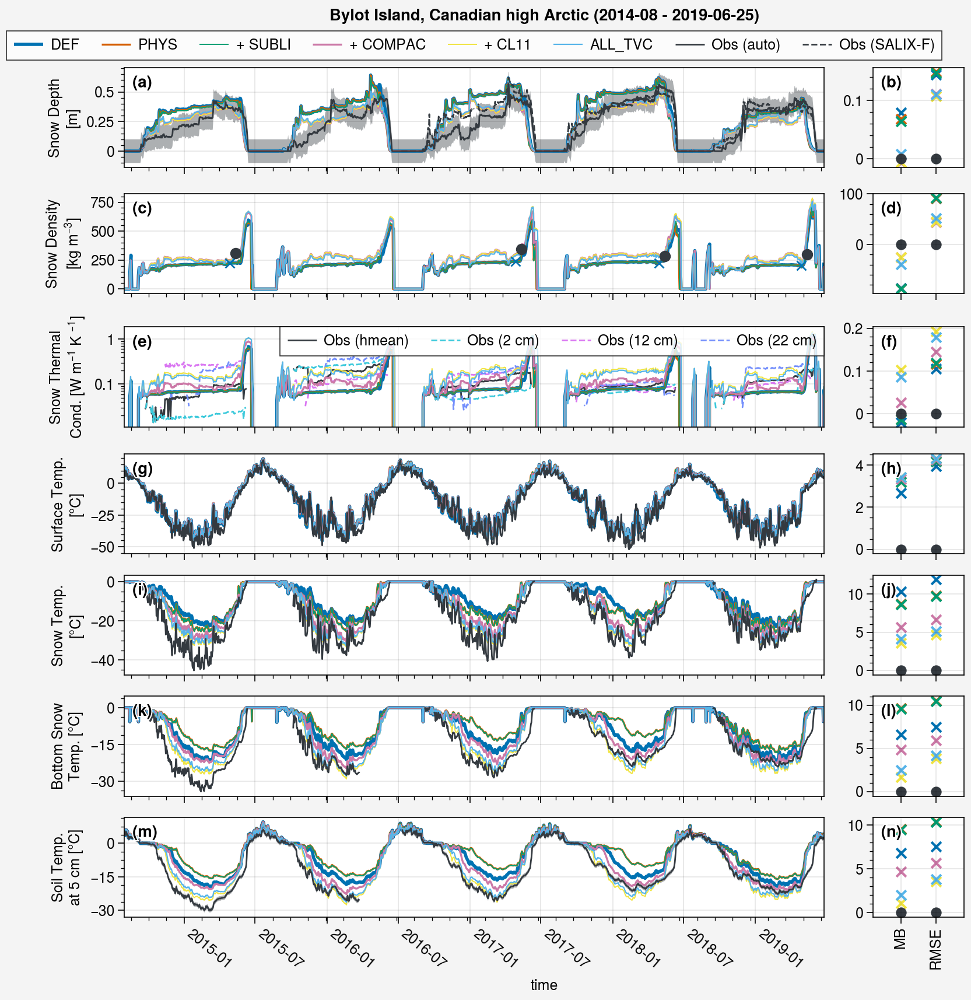

In [83]:
%matplotlib inline
import numpy as np

# -----------------------
# ONLY linewidth hierarchy for experiments (no color changes)
# label_exps is defined above
# -----------------------
def lw_exp(label_exp):
    if label_exp == 'DEF':
        return 2
    elif label_exp == 'PHYS':
        return 1.2
    elif label_exp == '+ SUBLI':
        return 0.7
    elif label_exp == '+ COMPAC':
        return 1.2
    elif label_exp == '+ CL11':
        return 0.7
    elif label_exp == 'ALL_TVC':
        return 0.8
    else:
        return 1.0


color_obs = 'gray8'
period = slice('2014-08', '2019-06-25')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

fig, axs = pplt.subplots(nrows=7, ncols=2, refaspect=7, refwidth=6, sharey=0, wratios=(1, 0.13))
k = 0

##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=lw_exp(label_exp))
    else:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=lw_exp(label_exp), ls='--', c='C0')

    df_metrics.loc[('snd_auto', 'RMSE'), label] = (
        xs.rmse(
            ds_d.snd.sel(time=period).where(mask_sd),
            ds_d_obs.snd_auto.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values
    df_metrics.loc[('snd_auto', 'MB'), label] = (
        xs.me(
            ds_d.snd.sel(time=period).where(mask_sd),
            ds_d_obs.snd_auto.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values + 0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values - 0.1, axis=0),
), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1, label='Obs (SALIX-F)')
ax.format(ylabel='Snow Depth\n[m]', ylocator=0.25)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')], color=color_obs)
ax.format(xlim=(-0.8, 1.8))


k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=lw_exp(label_exp))
    else:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=lw_exp(label_exp), ls='--', c='C0')

    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (
        xs.rmse(
            ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(),
            ds_d_obs.snwdens.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values
    df_metrics.loc[('snwdens', 'MB'), label] = (
        xs.me(
            ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(),
            ds_d_obs.snwdens.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values

# Obs
ax.plot(
    ds_d_list[0].snwdens.sel(time=period).shift(time=15).where(ds_d_obs.snwdens.sel(time=period) > 0).shift(time=-15),
    color='C0',
    marker='x'
)
ax.plot(ds_d_obs.snwdens.sel(time=period), color=color_obs, marker='o')
ax.format(ylabel='Snow Density\n[kg m$^{-3}$]', ylocator=250)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')], color=color_obs)


k += 1
#############################
### Thermal cond in snow  ###
#############################
ax = axs[k]

color_dh = 'cyan4'
color_ws = 'indigo4'
color_mid = 'grape4'

# Obs
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs, lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1, ls='--', c=color_dh)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1, ls='--', c=color_mid)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1, ls='--', c=color_ws)
ax.format(ylabel='Snow Thermal\nCond. [W m$^{-1}$ K $^{-1}$]', yscale='log')
ax.legend(ncols=5, loc='ur')

for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    ax.plot(ds_d.tcsnow.sel(time=period), label=label_exp, lw=lw_exp(label_exp))
    df_metrics.loc[('tcsnow', 'RMSE'), label] = (
        xs.rmse(
            ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd),
            tcs_hmean.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values
    df_metrics.loc[('tcsnow', 'MB'), label] = (
        xs.me(
            ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd),
            tcs_hmean.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tcsnow'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tcsnow', 'Obs')], color=color_obs)


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.ts.sel(time=period) - 273.15, label=label_exp, lw=lw_exp(label_exp))
    else:
        ax.plot(ds_d.ts.sel(time=period) - 273.15, label=label_exp, lw=lw_exp(label_exp), ls='--', c='C0')

    df_metrics.loc[('ts', 'RMSE'), label] = (
        xs.rmse(
            ds_d.ts.sel(time=period).where(mask_sd) - 273.15,
            ds_d_obs.ts.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values
    df_metrics.loc[('ts', 'MB'), label] = (
        xs.me(
            ds_d.ts.sel(time=period).where(mask_sd) - 273.15,
            ds_d_obs.ts.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values

# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface Temp.\n[°C]', ylocator=25)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('ts', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=lw_exp(label_exp))
    else:
        ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=lw_exp(label_exp), ls='--', c='C0')

    df_metrics.loc[('tsn', 'RMSE'), label] = (
        xs.rmse(
            ds_d.tsn.sel(time=period).where(mask_sd),
            ds_d_obs.tsn.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values
    df_metrics.loc[('tsn', 'MB'), label] = (
        xs.me(
            ds_d.tsn.sel(time=period).where(mask_sd),
            ds_d_obs.tsn.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values

# Obs
ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Snow Temp.\n[°C]', ylocator=20)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsn', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=lw_exp(label_exp))
    else:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=lw_exp(label_exp), ls='--', c='C0')

    df_metrics.loc[('tsnbot', 'RMSE'), label] = (
        xs.rmse(
            ds_d.tsnbot.sel(time=period).where(mask_sd),
            TSNBOT_obs_day.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values
    df_metrics.loc[('tsnbot', 'MB'), label] = (
        xs.me(
            ds_d.tsnbot.sel(time=period).where(mask_sd),
            TSNBOT_obs_day.sel(time=period).where(mask_sd),
            skipna=True
        )
    ).values

# Obs
ax.plot(TSNBOT_obs_day.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Bottom Snow\nTemp. [°C]', ylocator=15)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')], color=color_obs)


k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05) - 273.15, label=label_exp, lw=lw_exp(label_exp))
    else:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05) - 273.15, label=label_exp, lw=lw_exp(label_exp), ls='--', c='C0')

    df_metrics.loc[('tsl_5', 'RMSE'), label] = (
        xs.rmse(
            ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd) - 273.15,
            ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd),
            skipna=True
        )
    ).values
    df_metrics.loc[('tsl_5', 'MB'), label] = (
        xs.me(
            ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd) - 273.15,
            ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd),
            skipna=True
        )
    ).values

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05) + 1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05) - 1, axis=0),
), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)', lw=1)
ax.format(ylabel='Soil Temp.\nat 5 cm [°C]', ylocator=15, xrotation=-40)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_5'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsl_5', 'Obs')], color=color_obs)
ax.format(xrotation=90)


fig.suptitle(site_longname + ' (' + period.start + ' - ' + period.stop + ')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=8, loc='t')

# fig.save('img/'+site+'_peat_paper_all_2014-2019_v2.png')
# fig.save('img/'+site+'_peat_paper_all_2014-2019_v2.jpg')
# fig.save('img/'+site+'_peat_paper_all_2014-2019_v2.pdf')


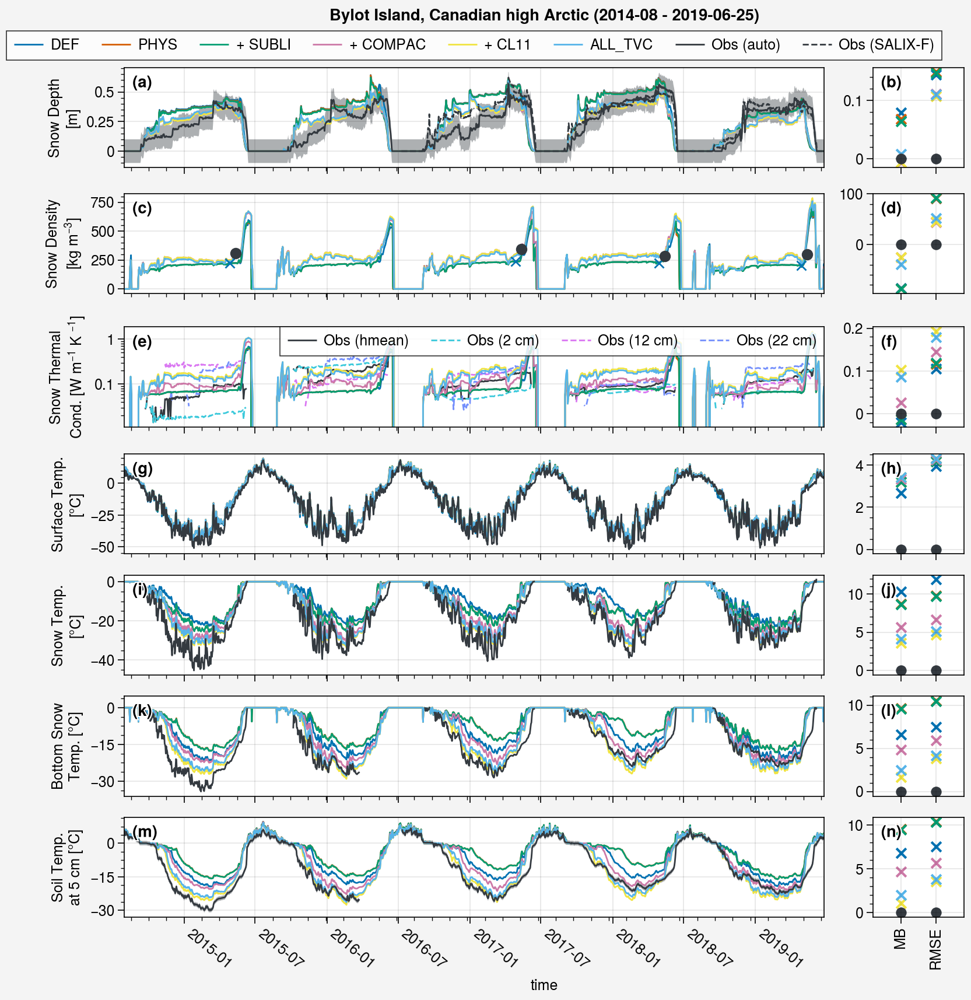

In [73]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2014-08', '2019-06-25')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=7, ncols=2, refaspect=7, refwidth=6, sharey=0, wratios=(1, 0.13))
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')

    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'MB'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1, label='Obs (SALIX-F)')
ax.format(ylabel='Snow Depth\n[m]', ylocator=0.25)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snd_auto', 'peat_TCZE_REF_TSNB_REF')], color='C0')
ax.format(xlim=(-0.8, 1.8))

 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(), 
                                                        ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'MB'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(), 
                                                      ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_list[0].snwdens.sel(time=period).shift(time=15).where(ds_d_obs.snwdens.sel(time=period) > 0).shift(time=-15), 
        color='C0', marker='x')
ax.plot(ds_d_obs.snwdens.sel(time=period), color=color_obs, marker='o')
ax.format(ylabel='Snow Density\n[kg m$^{-3}$]', ylocator=250)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snwdens', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### Thermal cond in snow ###
##################
ax = axs[k]

color_dh = 'cyan4'
color_ws = 'indigo4'
color_mid = 'grape4'

# Obs
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs, lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1, ls='--', c=color_dh)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1, ls='--', c=color_mid)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1, ls='--', c=color_ws)
ax.format(ylabel='Snow Thermal\nCond. [W m$^{-1}$ K $^{-1}$]', yscale='log')
ax.legend(ncols=5, loc='ur')

for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    ax.plot(ds_d.tcsnow.sel(time=period), label=label_exp, lw=1)
    df_metrics.loc[('tcsnow', 'RMSE'), label] = (xs.rmse(ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd), 
                                                        tcs_hmean.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tcsnow', 'MB'), label] = (xs.me(ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd), 
                                                      tcs_hmean.sel(time=period).where(mask_sd), skipna=True)).values
    
k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tcsnow'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tcsnow', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snwdens', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label_exp, lw=1)
    else:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                        ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'MB'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                      ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface Temp.\n[°C]', ylocator=25)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('ts', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'MB'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Snow Temp.\n[°C]', ylocator=20)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsn', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                        TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'MB'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                      TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(TSNBOT_obs_day.sel(time=period), color=color_obs, lw=1) 
ax.format(ylabel='Bottom Snow\nTemp. [°C]', ylocator=15)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsnbot', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label_exp, lw=1)
    else:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsl_5', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_5', 'MB'), label] = (xs.me(ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd), skipna=True)).values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)', lw=1)
ax.format(ylabel='Soil Temp.\nat 5 cm [°C]', ylocator=15, xrotation=-40)

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_5'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsl_5', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsl_5', 'peat_TCZE_REF_TSNB_REF')], color='C0')
ax.format(xrotation=90)





fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=8, loc='t')


# fig.save('img/'+site+'_peat_paper_all_2014-2019_v1.png')
# fig.save('img/'+site+'_peat_paper_all_2014-2019_v1.jpg')
# fig.save('img/'+site+'_peat_paper_all_2014-2019_v1.pdf')

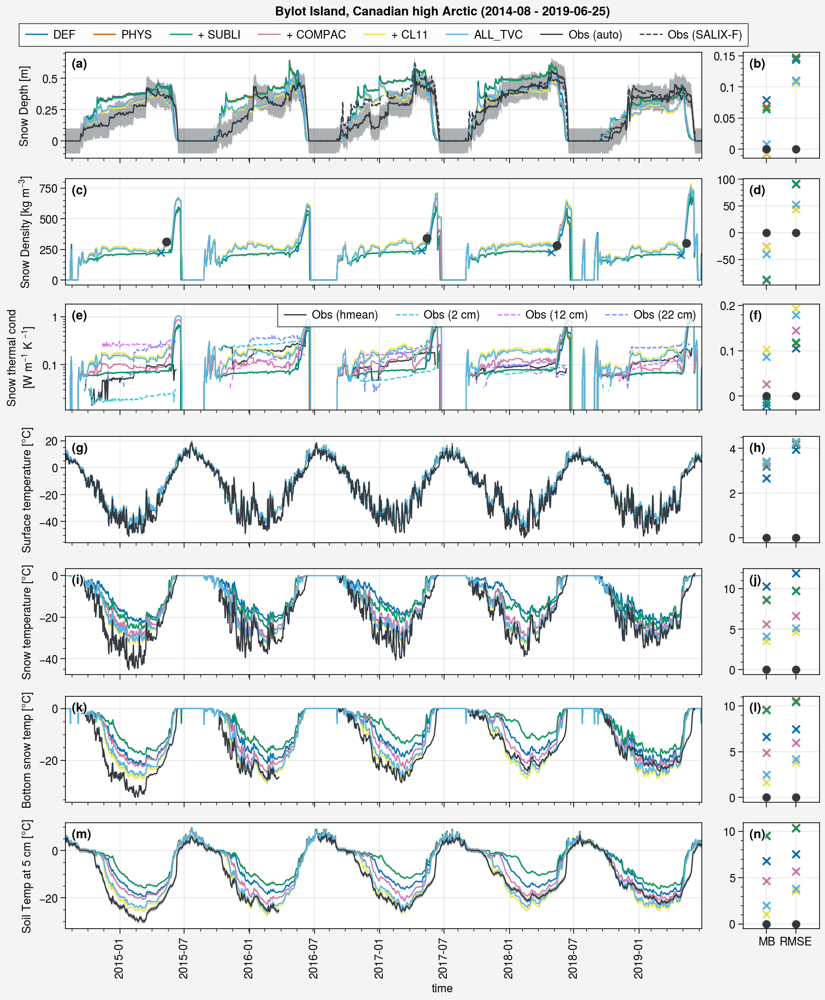

In [74]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2014-08', '2019-06-25')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=7, ncols=2, refaspect=6, refwidth=7, sharey=0, wratios=(1, 0.12))
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')

    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'MB'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1, label='Obs (SALIX-F)')
ax.format(ylabel='Snow Depth [m]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snd_auto', 'peat_TCZE_REF_TSNB_REF')], color='C0')
ax.format(xlim=(-0.8, 1.8))

 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(), 
                                                        ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'MB'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(), 
                                                      ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_list[0].snwdens.sel(time=period).shift(time=15).where(ds_d_obs.snwdens.sel(time=period) > 0).shift(time=-15), 
        color='C0', marker='x')
ax.plot(ds_d_obs.snwdens.sel(time=period), color=color_obs, marker='o')
ax.format(ylabel='Snow Density [kg m$^{-3}$]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snwdens', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### Thermal cond in snow ###
##################
ax = axs[k]

color_dh = 'cyan4'
color_ws = 'indigo4'
color_mid = 'grape4'

# Obs
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs, lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1, ls='--', c=color_dh)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1, ls='--', c=color_mid)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1, ls='--', c=color_ws)
ax.format(ylabel='Snow thermal cond\n[W m$^{-1}$ K $^{-1}$]', yscale='log')
ax.legend(ncols=5, loc='ur')

for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    ax.plot(ds_d.tcsnow.sel(time=period), label=label_exp, lw=1)
    df_metrics.loc[('tcsnow', 'RMSE'), label] = (xs.rmse(ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd), 
                                                        tcs_hmean.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tcsnow', 'MB'), label] = (xs.me(ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd), 
                                                      tcs_hmean.sel(time=period).where(mask_sd), skipna=True)).values
    
k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tcsnow'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tcsnow', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snwdens', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label_exp, lw=1)
    else:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                        ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'MB'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                      ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('ts', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'MB'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Snow temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsn', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                        TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'MB'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                      TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(TSNBOT_obs_day.sel(time=period), color=color_obs, lw=1) 
ax.format(ylabel='Bottom snow temp [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsnbot', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label_exp, lw=1)
    else:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsl_5', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_5', 'MB'), label] = (xs.me(ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd), skipna=True)).values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)', lw=1)
ax.format(ylabel='Soil Temp at 5 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_5'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsl_5', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsl_5', 'peat_TCZE_REF_TSNB_REF')], color='C0')



# k += 1
# ax = axs[k]
# # Simus
# for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
#     if i < 6:
#         ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp, lw=1)
#     else:
#         ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp, lw=1, ls='--', c='C0')
#     df_metrics.loc[('tsl_15', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
#                                                         ds_d_obs.tsl.sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
#     df_metrics.loc[('tsl_15', 'MB'), label] = (xs.me(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
#                                                       ds_d_obs.tsl.sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)', lw=1)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')

# k += 1
# ax = axs[k]
# ax.scatter(df_metrics.loc[('tsl_15'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
# ax.scatter(df_metrics.loc[('tsl_15', 'Obs')], color=color_obs)
# # ax.scatter(df_metrics.loc[('tsl_15', 'peat_TCZE_REF_TSNB_REF')], color='C0')




# # Simus
# for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
#     ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label_exp+' (layer 1)')
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 5 cm [°C]')
# ax.legend()

# k += 1
# ax = axs[k]
# # Simus
# for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
#     ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp+' (layer 2)')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')
# ax.legend()



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=8, loc='t')


# fig.save('img/'+site+'_peat_paper_all_2014-2019.png')
# fig.save('img/'+site+'_peat_paper_all_2014-2019.jpg')
# fig.save('img/'+site+'_peat_paper_all_2014-2019.pdf')

In [75]:
df_metrics

Obs               peat_DEF peat_BUG_CORRECT_TSNBT_OP1_EZERO  \
snd_auto MB     0    0.07878470030479807              0.06824919419122641   
         RMSE   0    0.14400356434375736               0.1481324360357674   
snwdens  MB     0     -87.18789721681574                -87.7158146248438   
         RMSE   0      90.62265192446904                91.13705348945312   
tcsnow   MB     0  -0.020255729597586487            -0.013930655051015362   
         RMSE   0    0.10567193564906009              0.11676994915150246   
ts       MB     0      2.668829284165152               3.1953895661158924   
         RMSE   0     3.9488429727073404                4.177783866263342   
tsn      MB     0     10.288607334692397                 8.66043067763853   
         RMSE   0      11.87284215640673                9.777949584580503   
tsnbot   MB     0      6.629404655480835                9.614878066236088   
         RMSE   0      7.480344770269413                10.53059921218079   
tsl_5    MB     0      6.805080884328851                9.551789380813872   
         RMSE   0      7.528592984684585               10.379589807933513   
tsl_15   MB     0                    NaN                              NaN   
         RMSE   0                    NaN                              NaN   

              peat_PHYS_ALL_SUBLI_v2 peat_PHYS_ALL_SUBLI_v2_COMPAC_v1  \
snd_auto MB      0.06439352771657857            -0.006816003504318332   
         RMSE    0.14630520698620786              0.11073468646432474   
snwdens  MB       -88.24655604251866               -25.61786422651506   
         RMSE      91.64140489875045                44.13958310593827   
tcsnow   MB    -0.013531256965827035             0.026310415139655357   
         RMSE    0.11844828063836915               0.1441614843251739   
ts       MB       3.1940892144760435               3.3370760847250125   
         RMSE      4.180950704596277                4.244936128942227   
tsn      MB        8.614810324718103                5.645265140927506   
         RMSE      9.725929765125821               6.6374178145020695   
tsnbot   MB        9.546745784637041                4.877657680626665   
         RMSE      10.45561171756649                5.956475066717855   
tsl_5    MB        9.490484340136675                4.661127276411118   
         RMSE     10.311821252700408                5.662205238905394   
tsl_15   MB                      NaN                              NaN   
         RMSE                    NaN                              NaN   

              peat_PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne  \
snd_auto MB                      -0.005585213408956845   
         RMSE                      0.10716087745724014   
snwdens  MB                         -25.91487912240794   
         RMSE                        44.45188775994819   
tcsnow   MB                        0.10302046880046128   
         RMSE                      0.19231013097072527   
ts       MB                         3.4344183302034503   
         RMSE                        4.316441773087676   
tsn      MB                         3.5744087189183724   
         RMSE                        4.657657290584046   
tsnbot   MB                         1.6561038510758808   
         RMSE                        3.821561853896359   
tsl_5    MB                          1.093514089382742   
         RMSE                       3.5427194747084596   
tsl_15   MB                                        NaN   
         RMSE                                      NaN   

              peat_PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne  
snd_auto MB                                0.008168160798164768  
         RMSE                               0.10993891018308008  
snwdens  MB                                 -39.662307215047605  
         RMSE                                 52.24591613397585  
tcsnow   MB                                 0.08642107882440694  
         RMSE                               0.17890982304363123  
ts       MB  

In [76]:
tot_year = y_end - y_start + 1
gap = 4
years = pplt.arange(y_start, y_end)
years

array([2013, 2014, 2015, 2016, 2017, 2018, 2019])

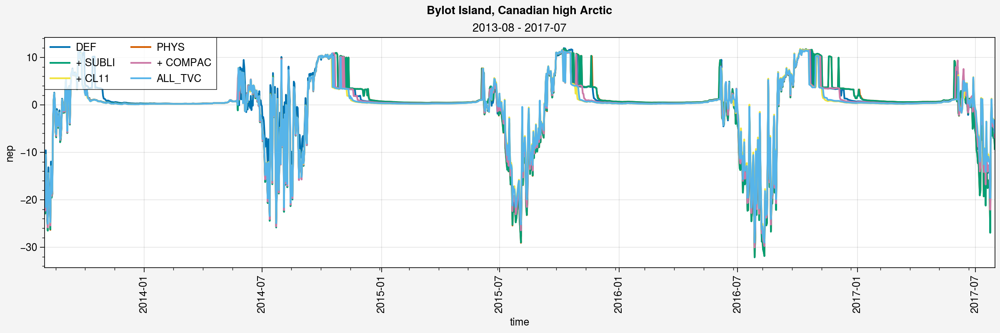

In [77]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
        axs[0].plot(-ds_d.nep.sel(time=period)*1e9, label=label_exp)
    
    # Obs
    # axs[0].plot(ds_d_turb.nee.sel(time=period)*1e8, color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)
    # fig.save('bylot_snd.pdf')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

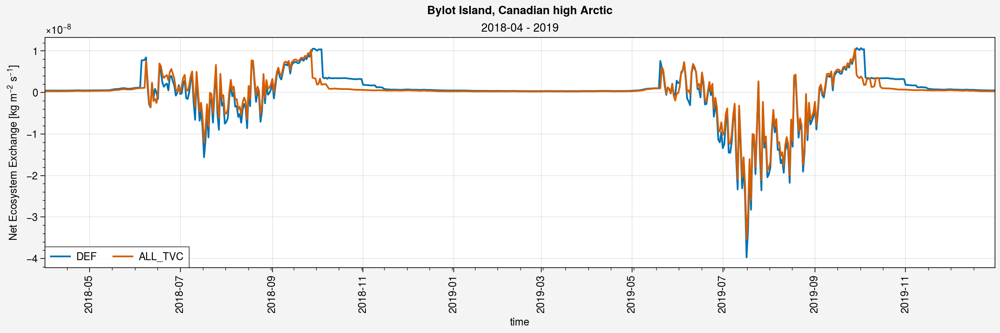

In [78]:
%matplotlib inline

color_obs = 'gray8'

fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

period=slice('2018-04','2019')

# Simus
# for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
#     axs[0].plot(-ds_d.nep.sel(time=period)/(44.01e-9)*10, label=label_exp)

axs[0].plot(-ds_d_list[0].nep.sel(time=period), label=label_exps[0])
axs[0].plot(-ds_d_list[-1].nep.sel(time=period), label=label_exps[-1])


# Obs
# axs[0].plot(ds_d_turb.nee.sel(time=period), color=color_obs, lw=0.5)

axs[0].legend(ncols=3)
axs[0].format(
    title = period.start+' - '+period.stop,
    ylabel = 'Net Ecosystem Exchange [kg m$^{-2}$ s$^{-1}$]'
)

fig.suptitle(site_longname)
# fig.save('bylot_snd.pdf')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

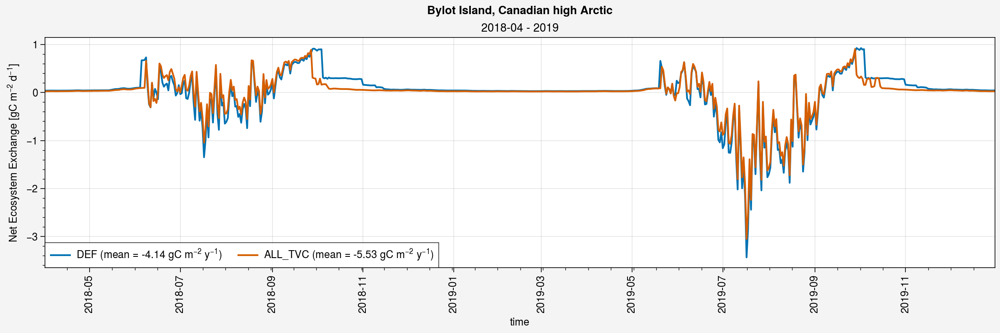

In [79]:
%matplotlib inline

color_obs = 'gray8'

fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

period=slice('2018-04','2019')

# Simus
# for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
#     axs[0].plot(-ds_d.nep.sel(time=period)/(44.01e-9)*10, label=label_exp)

axs[0].plot(-ds_d_list[0].nep.sel(time=period)*86400000, label=label_exps[0] + ' (mean = ' + str(np.round(-ds_d_list[0].nep.sel(time=period).mean().values*86400000*365, 2)) + ' gC m$^{-2}$ y$^{-1}$)')
axs[0].plot(-ds_d_list[-1].nep.sel(time=period)*86400000, label=label_exps[-1] + ' (mean = ' + str(np.round(-ds_d_list[-1].nep.sel(time=period).mean().values*86400000*365, 2)) + ' gC m$^{-2}$ y$^{-1}$)')


# Obs
# axs[0].plot(ds_d_turb.nee.sel(time=period), color=color_obs, lw=0.5)

axs[0].legend(ncols=3)
axs[0].format(
    title = period.start+' - '+period.stop,
    ylabel = 'Net Ecosystem Exchange [gC m$^{-2}$ d$^{-1}$]'
)

fig.suptitle(site_longname)
# fig.save('bylot_carbon_fluxes_2018_2019.jpg')

In [80]:
np.round(-ds_d_list[0].nep.sel(time=period).mean().values, 12)

-1.31e-10

In [81]:
ds_d_list[0].nep

<xarray.DataArray 'nep' (time: 2556)> Size: 20kB
array([-4.81318725e-10, -4.61753297e-10, -4.55159501e-10, ...,
       -4.85308397e-10, -4.78820705e-10, -4.88986444e-10])
Coordinates:
  * time     (time) datetime64[ns] 20kB 2013-01-01 2013-01-02 ... 2019-12-31
Attributes:
    long_name:   Natural flux of CO2 (expressed as a mass flux of carbon) fro...
    units:       kg m$^{-2}$ s$^{-1}$
    nameInCode:  nep_d_g